# TCR gene fragment usage analysis

* Comparisons of TCR repertoire propertiesfor thymocytes, CB-derived cells, and PSC-derived cells
    * VDJ gene usage 
    * CDR3 lengths 
* Tables are .tsv exports of the "Rearrangement Details" view from Adaptive Bio

## Import packages and set global properties

In [ ]:
# Kernel: base

import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib.collections import PolyCollection
import seaborn as sns
from sklearn.metrics import r2_score
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from scipy.interpolate import splrep, BSpline

## settings
# set paths
PATH_PROJ_DIR = pathlib.Path(".")  # project directory
PATH_DATA_DIR = pathlib.Path(PATH_PROJ_DIR) / "data"
PATH_FIG_DIR = pathlib.Path(PATH_PROJ_DIR) / "figures" / "TCR_analysis"
PATH_EXPORT_DIR = pathlib.Path(PATH_PROJ_DIR) / "export" / "TCR_analysis"  # export directory
# create figures directory if it does not exist
PATH_FIG_DIR.mkdir(parents=True, exist_ok=True)
PATH_EXPORT_DIR.mkdir(parents=True, exist_ok=True)

%config InlineBackend.figure_formats = ['png']
plt.rcParams['font.family'] = 'Arial'  # For weird character issues when defaul DejaVu/Helvetica fonts can't be found
plt.rcParams['figure.dpi'] = '300'     # Default is 100

## Define constants/functions

### Define TCR gene order

+/- pseudogenes

In [2]:
INCLUDE_PSEUDOGENES = False

TRBJ = ['TRBJ01-01', 'TRBJ01-02', 'TRBJ01-03', 'TRBJ01-04', 'TRBJ01-05', 'TRBJ01-06', \
        'TRBJ02-01', 'TRBJ02-02', 'TRBJ02-03', 'TRBJ02-04', 'TRBJ02-05', 'TRBJ02-06', 'TRBJ02-07']

if INCLUDE_PSEUDOGENES:
    # All genes
    TRBV = ['TRBV01-01', 'TRBV02-01', 'TRBV03-01/03-02', 
            'TRBV04-01', 'TRBV05-01', 'TRBV06-01', 'TRBV07-01',
            'TRBV04-02', 
            'TRBV04-03',              'TRBV06-02/06-03', 'TRBV07-02', 'TRBV08-01', 
                         'TRBV05-02', 'TRBV06-04', 'TRBV07-03', 'TRBV08-02',
                         'TRBV05-03', 
            'TRBV09-01', 'TRBV10-01', 'TRBV11-01', 
                         'TRBV10-02', 'TRBV11-02', 'TRBV12-02', 
                                      'TRBV06-05', 'TRBV07-04',
                         'TRBV05-04', 'TRBV06-06', 'TRBV07-05', 
                         'TRBV05-05', 'TRBV06-07', 'TRBV07-06', 
                         'TRBV05-06', 'TRBV06-08', 'TRBV07-07', 
                         'TRBV05-07', 'TRBV06-09', 'TRBV07-08', 
                         'TRBV05-08',              'TRBV07-09', 'TRBV13-01', 
                         'TRBV10-03', 'TRBV11-03', 'TRBV12-03/12-04', 
                                                   'TRBV12-05', 
            'TRBV14-01', 'TRBV15-01', 'TRBV16-01', 'TRBV17-01', 'TRBV18-01',
            'TRBV19-01', 'TRBV20-01', 'TRBV20-or9-02', 'TRBV21-01', 
            'TRBV22-01', 'TRBV23-01', 'TRBV24-01', 'TRBV25-01',
            'TRBVA-01',  'TRBV26-01', 'TRBVB-01',  'TRBV27-01', 
            'TRBV28-01', 'TRBV29-01', 'TRBV30-01']
else:
    # Sans pseudogenes
    TRBV = [             'TRBV02-01', 'TRBV03-01/03-02', 
            'TRBV04-01', 'TRBV05-01', 'TRBV06-01', 'TRBV07-01',
            'TRBV04-02', 
            'TRBV04-03',              'TRBV06-02/06-03', 'TRBV07-02',
                                      'TRBV06-04', 'TRBV07-03',
                         'TRBV05-03', 
            'TRBV09-01', 'TRBV10-01', 'TRBV11-01', 
                         'TRBV10-02', 'TRBV11-02',
                                      'TRBV06-05', 'TRBV07-04',
                         'TRBV05-04', 'TRBV06-06',
                         'TRBV05-05', 'TRBV06-07', 'TRBV07-06', 
                         'TRBV05-06', 'TRBV06-08', 'TRBV07-07', 
                         'TRBV05-07', 'TRBV06-09', 'TRBV07-08', 
                         'TRBV05-08',              'TRBV07-09', 'TRBV13-01', 
                         'TRBV10-03', 'TRBV11-03', 'TRBV12-03/12-04', 
                                                   'TRBV12-05', 
            'TRBV14-01', 'TRBV15-01', 'TRBV16-01', 'TRBV17-01', 'TRBV18-01',
            'TRBV19-01', 'TRBV20-01', 'TRBV21-01', 
            'TRBV23-01', 'TRBV24-01', 'TRBV25-01',
            'TRBV27-01', 'TRBV28-01', 'TRBV29-01', 'TRBV30-01']

print(len(TRBV))


if INCLUDE_PSEUDOGENES: 
    # All genes
    TRAV = ['TRAV01-01',     'TRAV01-02', 'TRAV02-01', 'TRAV03-01', 'TRAV04-01', 'TRAV05-01',
            'TRAV06-01',     'TRAV07-01', 'TRAV08-01', 'TRAV09-01', 'TRAV10-01', 'TRAV11-01', 
            'TRAV12-01',     'TRAV08-02', 'TRAV08-03', 'TRAV13-01', 
            'TRAV12-02',     'TRAV08-04', 'TRAV08-05', 'TRAV13-02',
            'TRAV14-01/DV4', 'TRAV09-02', 'TRAV15-01',
            'TRAV12-03',     'TRAV08-06', 'TRAV08-07',
            'TRAV16-01',     'TRAV17-01', 'TRAV18-01', 'TRAV19-01', 'TRAV20-01', 'TRAV21-01', 'TRAV22-01',
            'TRAV23-01/DV6', 'TRDV1-01',  'TRAV24-01', 'TRAV25-01',
            'TRAV26-01',     'TRAV08-07',
            'TRAV27-01',     'TRAV28-01', 'TRAV29-01', 'TRAV30-01', 'TRAV31-01', 'TRAV32-01', 'TRAV33-01',
            'TRAV26-02',     'TRAV34-01', 'TRAV35-01', 
            'TRAV36-01/DV7', 'TRAV37-01', 'TRAV38-01',
            'TRAV38-02/DV8', 'TRAV39-01', 'TRAV40-01', 'TRAV41-01']
    
    TRAJ = ['TRAJ' + str(x) for x in range(61, 1, -1) + '-01']

else:
    # Sans pseudogenes
    TRAV = ['TRAV01-01',     'TRAV01-02', 'TRAV02-01', 'TRAV03-01', 'TRAV04-01', 'TRAV05-01',
            'TRAV06-01',     'TRAV07-01', 'TRAV08-01', 'TRAV09-01', 'TRAV10-01',
            'TRAV12-01',     'TRAV08-02', 'TRAV08-03', 'TRAV13-01',
            'TRAV12-02',     'TRAV08-04',              'TRAV13-02',
            'TRAV14-01/DV4', 'TRAV09-02',
            'TRAV12-03',     'TRAV08-06',
            'TRAV16-01',     'TRAV17-01', 'TRAV19-01', 'TRAV20-01', 'TRAV21-01', 'TRAV22-01',
            'TRAV23-01/DV6', 'TRAV24-01', 'TRAV25-01',
            'TRAV26-01',     
            'TRAV27-01',     'TRAV29-01', 'TRAV30-01',
            'TRAV26-02',     'TRAV34-01', 'TRAV35-01', 
            'TRAV36-01/DV7', 'TRAV38-01',
            'TRAV38-02/DV8', 'TRAV39-01', 'TRAV40-01', 'TRAV41-01']
    
    TRAJ = ['TRAJ58-01', 'TRAJ57-01', 'TRAJ56-01',              
                         'TRAJ54-01', 'TRAJ53-01', 'TRAJ52-01',
            'TRAJ50-01', 'TRAJ49-01', 'TRAJ48-01', 'TRAJ47-01', 'TRAJ46-01', 
            'TRAJ45-01', 'TRAJ44-01', 'TRAJ43-01', 'TRAJ42-01', 'TRAJ41-01', 
            'TRAJ40-01', 'TRAJ39-01', 'TRAJ38-01', 'TRAJ37-01', 'TRAJ36-01',
                         'TRAJ34-01', 'TRAJ33-01', 'TRAJ32-01', 'TRAJ31-01', 
            'TRAJ30-01', 'TRAJ29-01', 'TRAJ28-01', 'TRAJ27-01', 'TRAJ26-01', 
            'TRAJ25-01', 'TRAJ24-01', 'TRAJ23-01', 'TRAJ22-01', 'TRAJ21-01', 
            'TRAJ20-01',              'TRAJ18-01', 'TRAJ17-01',              
            'TRAJ15-01',              'TRAJ13-01', 'TRAJ12-01', 'TRAJ11-01',
            'TRAJ10-01', 'TRAJ09-01', 'TRAJ08-01', 'TRAJ07-01', 'TRAJ06-01',
            'TRAJ05-01', 'TRAJ04-01', 'TRAJ03-01']

53


## Process data

### Load data

In [ ]:
datasets = ['PBMC Collated 2 filtered', 'LD-SC40 Revision', 
            'Fetal_w13_FCAImm', 'Fetal_w14_FCAImm', 'Fetal_thy_w17', 
            'Postnatal_thy_10m', 'Postnatal_30m_T06', 'Adult_thy']
df_all = pd.read_excel(PATH_DATA_DIR / 'TCR Clones Collated.xlsx', sheet_name = datasets, header = 0)
# 'eAM28 LD-SC27a'
# 'PMBC Adaptive19'

### Label subsets

In [73]:
# Label different subsets
# - cell_type: standard cell types
# - cell_type_ext: extended mem/eff for iPSCs
for d in df_all:
    
    for index, row in df_all[d].iterrows():
        
        # NOTE: Don't do these as match-case since we're looking for substrings

        if ('gdT' in row['Sample']) or ('ILC' in row['Sample']) or ('CD8aa' in row['Sample']) or ('CD8αα' in row['Sample']):
            cell_type     = 'Innate'
            cell_type_ext = 'Innate'
        elif ('Met-Act/Stress' in row['Sample']):
            cell_type     = 'Stressed'
            cell_type_ext = 'Stressed'

        # elif 'DP (P)' in row['Sample']: # From old code
        #     cell_type = 'DP (P)'
        elif 'DP' in row['Sample']:
            cell_type     = 'DP'
            cell_type_ext = 'DP'
        
        # From old code
        # elif 'CD4 immature' in row['Sample']:
        #     cell_type = 'CD4_immature'
        # elif 'CD4 mature' in row['Sample']:
        #     cell_type = 'CD4_mature'

        # This is if we want to break out different mem/eff types
        elif ('4SP_N/CM' in row['Sample']) or ('4SP_TM' in row['Sample']):
            cell_type     = 'CD4'
            cell_type_ext = 'CD4_N/CM/TM'
        elif ('8SP_N/CM' in row['Sample']) or ('8SP_TM' in row['Sample']):
            cell_type     = 'CD8'
            cell_type_ext = 'CD8_N/CM/TM'
        elif ('4SP_EM' in row['Sample']) or ('4SP_Mem(P)' in row['Sample']):
            cell_type     = 'CD4'
            cell_type_ext = 'CD4_EM/Mem(P)'
        elif ('8SP_EM' in row['Sample']) or ('8SP_Mem(P)' in row['Sample']):
            cell_type     = 'CD8'
            cell_type_ext = 'CD8_EM/Mem(P)'
        elif ('4SP_Eff/Ex' in row['Sample']) or ('4SP_Eff(P)' in row['Sample']):
            cell_type     = 'CD4'
            cell_type_ext = 'CD4_Eff/Ex/Eff(P)'
        elif ('8SP_Eff/Ex' in row['Sample']) or ('8SP_Eff(P)' in row['Sample']):
            cell_type     = 'CD8'
            cell_type_ext = 'CD8_Eff/Ex/Eff(P)'

        elif ('4SP' in row['Sample']) or ('CD4' in row['Sample']):
            cell_type     = 'CD4'
            cell_type_ext = 'CD4'
        elif ('8SP' in row['Sample']) or ('CD8' in row['Sample']):
            cell_type     = 'CD8'
            cell_type_ext = 'CD8'
        else:
            cell_type     = None
            cell_type_ext = None
        
        df_all[d].loc[index, 'Cell Type']     = cell_type
        df_all[d].loc[index, 'Cell Type Ext'] = cell_type_ext
        
    if 'Fetal' in d:
        df_all[d]['Subset'] = 'Fetal Thym'
    elif 'Postnatal' in d:
        df_all[d]['Subset'] = 'Postnatal Thym'
    elif 'Adult' in d:
        df_all[d]['Subset'] = 'Adult Thym'
    elif 'PBMC' in d:
        df_all[d]['Subset'] = 'PBMC'
    else:
        df_all[d]['Subset'] = 'iPSC'

    df_all[d]['Subset Cell Type']     = df_all[d]['Subset'] + ' ' + df_all[d]['Cell Type']
    df_all[d]['Subset Cell Type Ext'] = df_all[d]['Subset'] + ' ' + df_all[d]['Cell Type Ext']

display(df_all)

{'PBMC Collated 2 filtered':       Clone ID             Sample  Templates          CDR3_A        VA  \
 0         5386     CD4+T - 5046BW          1   CAAAARSGDKLTF   TRAV8-3   
 1         5039     CD4+T - 5046BW          1  CAAAASGGSYIPTF    TRAV22   
 2         8092  CD8+T - BP0219101          1    CAAADSNYQLIW   TRAV1-2   
 3          381     CD4+T - 2982BW          1    CAAADSWGKFQF   TRAV1-1   
 4         3803     CD4+T - 3577BW          1   CAAAFDSNYQLIW  TRAV13-1   
 ...        ...                ...        ...             ...       ...   
 9015      2703     CD8+T - 3126BW          1             NaN       NaN   
 9016      2719     CD8+T - 3126BW          1             NaN       NaN   
 9017      2752     CD8+T - 3126BW          1             NaN       NaN   
 9018      2810     CD8+T - 3126BW          1             NaN       NaN   
 9019      2818     CD8+T - 3126BW          1             NaN       NaN   
 
           JA             CDR3_B        VB       JB Cell Type Subset  

### Clean up the names of TCR fragments

* Remove allele designations from TCR gene names
* Add '-01' to the end of any fragment missing such an indicator
    * Some sources do/don't include if only one e.g. TRAV05 vs TRAV05-01
* Set all names to TRAJ, TRAV, TRBJ, TRBV, rather than TCRA/B/V/J 

Compute CDR3 lengths if not already in the table

#### Functions

In [7]:
# A few possible exceptions remaining include:
# - Tandem names: TRBV03-01/03-02, TRBV06-02/06-03, and TRBV12-03/12-04

def fixdash(x):
    if x in [None, np.nan]:
        return x
    
    if len(x) < 6 or x[5] == '-':
        # Fix missing '0' for single-digit fragment ID eg 1, 2, 3...
        x = x[:4] + '0' + x[4:]
    
    # Handle missing second part of fragment ID (often omitted)
    if len(x) < 7:
        x = x + '-01'
    else:
        # Handle presence of DV chain IDs
        x = x if x[6] == '-' else x[:6] + '-01' + x[6:]

    # Ensure after-dash part is two digits
    if len(x) < 9 or x[8] not in '0123456789':
        x = x[:7] + '0' + x[7:]
    
    return x

def fixdv(x):
    if x in [None, np.nan]:
        return x
    elif 'DV' in x:
        return x if '/' in x else x[:9] + '/' + x[9:]
    else:
        if 'TRAV14' in x: 
            return x + '/DV4'
        elif 'TRAV23' in x:
            return x + '/DV6'
        elif 'TRAV29' in x:
            return x + '/DV5'
        elif 'TRAV36' in x:
            return x + '/DV7'
        elif 'TRAV38-02' in x:
            return x + '/DV8'
        else:
            return x

test = pd.DataFrame({'Chain': [None, np.nan, 'TRBJ2', 'TRAV01', 'TRBV01-01', 'TRBJ01-02', 'TRAJ06/DV6', 'TRAV08-01/DV4', 'TRAV29DV5', 'TRAV36/DV7', 'TRAV38-02', 'TRBV6-3']})
test['Chain_fixed_dash'] = test['Chain'].apply(fixdash)
test['Chain_fixed_dv'] = test['Chain_fixed_dash'].apply(fixdv)
display(test)

,Chain,Chain_fixed_dash,Chain_fixed_dv
0,None,None,None
1,NaN,NaN,NaN
2,TRBJ2,TRBJ02-01,TRBJ02-01
3,TRAV01,TRAV01-01,TRAV01-01
4,TRBV01-01,TRBV01-01,TRBV01-01
5,TRBJ01-02,TRBJ01-02,TRBJ01-02
6,TRAJ06/DV6,TRAJ06-01/DV6,TRAJ06-01/DV6
7,TRAV08-01/DV4,TRAV08-01/DV4,TRAV08-01/DV4
8,TRAV29DV5,TRAV29-01DV5,TRAV29-01/DV5
9,TRAV36/DV7,TRAV36-01/DV7,TRAV36-01/DV7


#### Apply functions

In [75]:
df_coll = pd.concat([sheet for _, sheet in df_all.items()]).reset_index()
df = df_coll.loc[df_coll['Cell Type'].notna(), :].copy() # 'Cell Type' and 'Cell Type Ext' both always have paired data, so only need to check one

for chain in ['VB', 'JB', 'VA', 'JA']:
    df[chain] = df[chain].str.replace(r'\*.*', '', regex = True) # Strip allele information (most efficient to do these here)
    df[chain] = df[chain].str.replace('TCR', 'TR', regex = True) # Normalize naming convention
    df[chain] = df[chain].apply(fixdash)
    df[chain] = df[chain].apply(fixdv)

# Ensure CDR3 lengths are calculated
df['CDR3_B AA'] = df['CDR3_B'].apply(lambda x: len(x) if x not in [None, np.nan] else x)
df['CDR3_B bp'] = df['CDR3_B AA'].apply(lambda x: 3*x)
df['CDR3_A AA'] = df['CDR3_A'].apply(lambda x: len(x) if x not in [None, np.nan] else x)
df['CDR3_A bp'] = df['CDR3_A AA'].apply(lambda x: 3*x)

# display(df_coll)
display(df)


,index,Clone ID,Sample,Templates,CDR3_A,VA,JA,CDR3_B,VB,JB,...,CDR3 Match,Unnamed: 10,Unnamed: 11,Unnamed: 12,Unnamed: 13,Unnamed: 9,CDR3_B AA,CDR3_B bp,CDR3_A AA,CDR3_A bp
0,0,5386,CD4+T - 5046BW,1,CAAAARSGDKLTF,TRAV08-03,TRAJ46-01,CASSLGAGSYEQYF,TRBV07-09,TRBJ02-07,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,42.0,13.0,39.0
1,1,5039,CD4+T - 5046BW,1,CAAAASGGSYIPTF,TRAV22-01,TRAJ06-01,CSARESYEQYF,TRBV20-01,TRBJ02-07,...,NaN,NaN,NaN,NaN,NaN,NaN,11.0,33.0,14.0,42.0
2,2,8092,CD8+T - BP0219101,1,CAAADSNYQLIW,TRAV01-02,TRAJ33-01,CASSQEPPGQVSYEQYF,TRBV04-02,TRBJ02-07,...,NaN,NaN,NaN,NaN,NaN,NaN,17.0,51.0,12.0,36.0
3,3,381,CD4+T - 2982BW,1,CAAADSWGKFQF,TRAV01-01,TRAJ24-01,CASSLSITDTQYF,TRBV27-01,TRBJ02-03,...,NaN,NaN,NaN,NaN,NaN,NaN,13.0,39.0,12.0,36.0
4,4,3803,CD4+T - 3577BW,1,CAAAFDSNYQLIW,TRAV13-01,TRAJ33-01,CASSLGLGRETQYF,TRBV11-02,TRBJ02-05,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,42.0,13.0,39.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15984,93,840,CD8+Tmem,1,CALVLNFNKFYF,TRAV19-01,TRAJ21-01,CASSPTDRNTEAFF,TRBV07-09,TRBJ01-01,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,42.0,12.0,36.0
15985,94,842,CD8αα,1,CAAARTPLVF,TRAV25-01,TRAJ29-01,CASSLTGGTNEKLFF,TRBV02-01,TRBJ01-04,...,NaN,NaN,NaN,NaN,NaN,NaN,15.0,45.0,10.0,30.0
15986,95,850,DP,1,CGAPFINTGTASKLTF,TRAV34-01,TRAJ44-01,CSARVKRTSGVPRELFF,TRBV20-01,TRBJ02-02,...,NaN,NaN,NaN,NaN,NaN,NaN,17.0,51.0,16.0,48.0
15988,97,875,CD8+T,1,CALNNNAGNMLTF,TRAV24-01,TRAJ39-01,CSVAETAYEQYF,TRBV29-01,TRBJ02-07,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,36.0,13.0,39.0


#### Drop unnamed columns

In [76]:
for col in df:
    if 'Unnamed' in col:
        df.drop([col], axis = 'columns', inplace = True)
        
display(df)

,index,Clone ID,Sample,Templates,CDR3_A,VA,JA,CDR3_B,VB,JB,...,Cell Type Ext,Subset Cell Type Ext,Index,cd4_cd8_subset_thresh3,cell_type_ross2,CDR3 Match,CDR3_B AA,CDR3_B bp,CDR3_A AA,CDR3_A bp
0,0,5386,CD4+T - 5046BW,1,CAAAARSGDKLTF,TRAV08-03,TRAJ46-01,CASSLGAGSYEQYF,TRBV07-09,TRBJ02-07,...,CD4,PBMC CD4,NaN,NaN,NaN,NaN,14.0,42.0,13.0,39.0
1,1,5039,CD4+T - 5046BW,1,CAAAASGGSYIPTF,TRAV22-01,TRAJ06-01,CSARESYEQYF,TRBV20-01,TRBJ02-07,...,CD4,PBMC CD4,NaN,NaN,NaN,NaN,11.0,33.0,14.0,42.0
2,2,8092,CD8+T - BP0219101,1,CAAADSNYQLIW,TRAV01-02,TRAJ33-01,CASSQEPPGQVSYEQYF,TRBV04-02,TRBJ02-07,...,CD8,PBMC CD8,NaN,NaN,NaN,NaN,17.0,51.0,12.0,36.0
3,3,381,CD4+T - 2982BW,1,CAAADSWGKFQF,TRAV01-01,TRAJ24-01,CASSLSITDTQYF,TRBV27-01,TRBJ02-03,...,CD4,PBMC CD4,NaN,NaN,NaN,NaN,13.0,39.0,12.0,36.0
4,4,3803,CD4+T - 3577BW,1,CAAAFDSNYQLIW,TRAV13-01,TRAJ33-01,CASSLGLGRETQYF,TRBV11-02,TRBJ02-05,...,CD4,PBMC CD4,NaN,NaN,NaN,NaN,14.0,42.0,13.0,39.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15984,93,840,CD8+Tmem,1,CALVLNFNKFYF,TRAV19-01,TRAJ21-01,CASSPTDRNTEAFF,TRBV07-09,TRBJ01-01,...,CD8,Adult Thym CD8,NaN,NaN,NaN,NaN,14.0,42.0,12.0,36.0
15985,94,842,CD8αα,1,CAAARTPLVF,TRAV25-01,TRAJ29-01,CASSLTGGTNEKLFF,TRBV02-01,TRBJ01-04,...,Innate,Adult Thym Innate,NaN,NaN,NaN,NaN,15.0,45.0,10.0,30.0
15986,95,850,DP,1,CGAPFINTGTASKLTF,TRAV34-01,TRAJ44-01,CSARVKRTSGVPRELFF,TRBV20-01,TRBJ02-02,...,DP,Adult Thym DP,NaN,NaN,NaN,NaN,17.0,51.0,16.0,48.0
15988,97,875,CD8+T,1,CALNNNAGNMLTF,TRAV24-01,TRAJ39-01,CSVAETAYEQYF,TRBV29-01,TRBJ02-07,...,CD8,Adult Thym CD8,NaN,NaN,NaN,NaN,12.0,36.0,13.0,39.0


### Compute counts for each V-J combination per subset

In [87]:
# Sum TRB V/J combos, then V and J gene totals separately and CDR3 lengths
# NOTE: adjusted for Template #s (reads)
# NOTE: using simple version for standard calculations here
df_counts_ab = df.pivot_table(values = 'Templates', index = 'Subset Cell Type', columns = ['CDR3_A', 'VA', 'JA', 'CDR3_B', 'VB', 'JB'], aggfunc = 'sum')#.reset_index()

df_counts_vjca = df.pivot_table(values = 'Templates', index = 'Subset Cell Type', columns = ['CDR3_A', 'VA', 'JA'], aggfunc = 'sum')#.reset_index()
df_counts_vja  = df.pivot_table(values = 'Templates', index = 'Subset Cell Type', columns = ['VA', 'JA'], aggfunc = 'sum', fill_value = 0)#.reset_index()
df_counts_va   = df.pivot_table(values = 'Templates', index = 'Subset Cell Type', columns =  'VA',        aggfunc = 'sum', fill_value = 0)#.reset_index()
df_counts_ja   = df.pivot_table(values = 'Templates', index = 'Subset Cell Type', columns =  'JA',        aggfunc = 'sum', fill_value = 0)#.reset_index()

df_counts_vjcb = df.pivot_table(values = 'Templates', index = 'Subset Cell Type', columns = ['CDR3_B', 'VB', 'JB'], aggfunc = 'sum')#.reset_index()
df_counts_vjb  = df.pivot_table(values = 'Templates', index = 'Subset Cell Type', columns = ['VB', 'JB'], aggfunc = 'sum', fill_value = 0)#.reset_index()
df_counts_vb   = df.pivot_table(values = 'Templates', index = 'Subset Cell Type', columns =  'VB',        aggfunc = 'sum', fill_value = 0)#.reset_index()
df_counts_jb   = df.pivot_table(values = 'Templates', index = 'Subset Cell Type', columns =  'JB',        aggfunc = 'sum', fill_value = 0)#.reset_index()

df_cdr3a = df[df['CDR3_A AA'].notna()].pivot_table(values = 'Templates', index = 'Subset Cell Type', columns = 'CDR3_A AA', aggfunc = 'sum', sort = True)#.reset_index()
df_cdr3b = df[df['CDR3_B AA'].notna()].pivot_table(values = 'Templates', index = 'Subset Cell Type', columns = 'CDR3_B AA', aggfunc = 'sum', sort = True)#.reset_index()

display(df_counts_ab)

display(df_counts_vjca)
display(df_counts_vja)
display(df_counts_va)
display(df_counts_ja)
display(df_cdr3a)

display(df_counts_vjcb)
display(df_counts_vjb)
display(df_counts_vb)
display(df_counts_jb)
display(df_cdr3b)

CDR3_A,CAAAARSGDKLTF,CAAAASGGSYIPTF,CAAADSNYQLIW,CAAADSWGKFQF,CAAAFDSNYQLIW,CAAAFGNEKLTF,CAAAGAGTALIF,CAAAGGTSYGKLTF,CAAAGNTGRRALTF,CAAAGRRALTF,...,CVVVRKGGYNKLIF,CVVVTGGGNKLTF,CVVYGGGAQKLVF,CVVYNTNAGKSTF,CVVYRCNQFYF,CVWSNAGNMLTF,CVYGNTGKLIF,CVYSRGSGFKTIF,CYNDYKLSF,CYSTWRLSCLLLCREPITGNQFYF
VA,TRAV08-03,TRAV22-01,TRAV01-02,TRAV01-01,TRAV13-01,TRAV13-01,TRAV21-01,TRAV20-01,TRAV13-01,TRAV23-01/DV6,...,TRAV08-02,TRAV12-01,TRAV12-01,TRAV12-01,TRAV12-01,TRAV25-01,TRAV30-01,TRAV12-01,TRAV27-01,TRAV13-02
JA,TRAJ46-01,TRAJ06-01,TRAJ33-01,TRAJ24-01,TRAJ33-01,TRAJ48-01,TRAJ15-01,TRAJ52-01,TRAJ05-01,TRAJ05-01,...,TRAJ04-01,TRAJ10-01,TRAJ54-01,TRAJ27-01,TRAJ49-01,TRAJ39-01,TRAJ37-01,TRAJ09-01,TRAJ20-01,TRAJ49-01
CDR3_B,CASSLGAGSYEQYF,CSARESYEQYF,CASSQEPPGQVSYEQYF,CASSLSITDTQYF,CASSLGLGRETQYF,CASSSWGGKNEQYF,CASSHTGGSNEKLFF,CASSLTESTEAFF,CASAPLADTQYF,CASSLGQRNTGELFF,...,CASSEDLYTGELFF,CSVRGGSNEKLFF,CASSPPGSNYGYTF,CASSRGLAPNTGELFF,CASSQNYGTDYEQYF,CASSLVGGTSSYEQYF,CASSSSGTDETEQYF,CSALNPGLANDEQFF,CASSEAGGELFF,CSARPNLRGQVSNQPQHF
VB,TRBV07-09,TRBV20-01,TRBV04-02,TRBV27-01,TRBV11-02,TRBV11-02,TRBV28-01,TRBV07-06,TRBV07-06,TRBV18-01,...,TRBV02-01,TRBV20-01,TRBV07-09,TRBV03-01,TRBV13-01,TRBV07-08,TRBV06-05,TRBV20-01,TRBV04-02,TRBV20-01
JB,TRBJ02-07,TRBJ02-07,TRBJ02-07,TRBJ02-03,TRBJ02-05,TRBJ02-07,TRBJ01-04,TRBJ01-01,TRBJ02-03,TRBJ02-02,...,TRBJ02-02,TRBJ01-04,TRBJ01-02,TRBJ02-02,TRBJ02-07,TRBJ02-07,TRBJ02-07,TRBJ02-01,TRBJ02-02,TRBJ01-05
Subset Cell Type,,,,,,,,,,,,,,,,,,,,,
Adult Thym CD4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym CD8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym DP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym Innate,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


CDR3_A,CAAAARSGDKLTF,CAAAASGGSYIPTF,CAAADSNYQLIW,CAAADSWGKFQF,CAAAFDSNYQLIW,CAAAFGNEKLTF,CAAAGAGTALIF,CAAAGGTSYGKLTF,CAAAGNTGRRALTF,CAAAGRRALTF,...,CVVVRKGGYNKLIF,CVVVTGGGNKLTF,CVVYGGGAQKLVF,CVVYNTNAGKSTF,CVVYRCNQFYF,CVWSNAGNMLTF,CVYGNTGKLIF,CVYSRGSGFKTIF,CYNDYKLSF,CYSTWRLSCLLLCREPITGNQFYF
VA,TRAV08-03,TRAV22-01,TRAV01-02,TRAV01-01,TRAV13-01,TRAV13-01,TRAV21-01,TRAV20-01,TRAV13-01,TRAV23-01/DV6,...,TRAV08-02,TRAV12-01,TRAV12-01,TRAV12-01,TRAV12-01,TRAV25-01,TRAV30-01,TRAV12-01,TRAV27-01,TRAV13-02
JA,TRAJ46-01,TRAJ06-01,TRAJ33-01,TRAJ24-01,TRAJ33-01,TRAJ48-01,TRAJ15-01,TRAJ52-01,TRAJ05-01,TRAJ05-01,...,TRAJ04-01,TRAJ10-01,TRAJ54-01,TRAJ27-01,TRAJ49-01,TRAJ39-01,TRAJ37-01,TRAJ09-01,TRAJ20-01,TRAJ49-01
Subset Cell Type,,,,,,,,,,,,,,,,,,,,,
Adult Thym CD4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym CD8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym DP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym Innate,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fetal Thym CD4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fetal Thym CD8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fetal Thym DP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


VA                    TRAV01-01                                          \
JA                    TRAJ03-01 TRAJ04-01 TRAJ05-01 TRAJ06-01 TRAJ08-01   
Subset Cell Type                                                          
Adult Thym CD4                0         0         0         0         0   
Adult Thym CD8                0         0         0         0         0   
Adult Thym DP                 0         0         0         0         0   
Adult Thym Innate             0         0         0         0         0   
Fetal Thym CD4                0         0         1         1         0   
Fetal Thym CD8                0         2         1         1         1   
Fetal Thym DP                 0         0         0         0         0   
Fetal Thym Innate             0         0         1         0         0   
PBMC CD4                      1         1         0         1         1   
PBMC CD8                      2         0         0         0         0   
Postnatal Thym CD4            0         0         0         0         0   
Postnatal Thym CD8            0         0         0         0         0   
Postnatal Thym DP             0         0         1         0         0   
Postnatal Thym Innate         0         0         1         0         0   
iPSC CD4                      0         0         0         0         0   
iPSC CD8                      0         0         0         0         0   
iPSC DP                       0         0         0         0         0   
iPSC Innate                   0         0         0         0         0   
iPSC Stressed                 0         0         0         0         0   

VA                                                                       ...  \
JA                    TRAJ09-01 TRAJ10-01 TRAJ11-01 TRAJ12-01 TRAJ13-01  ...   
Subset Cell Type                                                         ...   
Adult Thym CD4                0         0         0         0         0  ...   
Adult Thym CD8                0         0         0         0         0  ...   
Adult Thym DP                 0         0         0         0         0  ...   
Adult Thym Innate             0         0         0         0         0  ...   
Fetal Thym CD4                0         0         1         0         0  ...   
Fetal Thym CD8                2         0         0         1         1  ...   
Fetal Thym DP                 0         0         0         0         0  ...   
Fetal Thym Innate             0         0         3         0         0  ...   
PBMC CD4                      4         0         0         0         1  ...   
PBMC CD8                      0         0         0         0         1  ...   
Postnatal Thym CD4            0         0         0         0         0  ...   
Postnatal Thym CD8            0         0         1         0         0  ...   
Postnatal Thym DP             0         0         0         0         1  ...   
Postnatal Thym Innate         1         1         0         0         0  ...   
iPSC CD4                      0         0         0         0         0  ...   
iPSC CD8                      0         0         0         0         0  ...   
iPSC DP                       0         0         0         0         0  ...   
iPSC Innate                   0         0         0         0         0  ...   
iPSC Stressed                 0         0         0         0         0  ...   

VA                    TRAV41-01                                          \
JA                    TRAJ47-01 TRAJ48-01 TRAJ49-01 TRAJ50-01 TRAJ52-01   
Subset Cell Type                                                          
Adult Thym CD4                0         0         0         0         0   
Adult Thym CD8                0         0         0         0         0   
Adult Thym DP                 0         0         0         0         0   
Adult Thym Innate             0         0         0         0         0   
Fetal Thym CD4                2         2         6         0  

VA,TRAV01-01,TRAV01-02,TRAV02-01,TRAV03-01,TRAV04-01,TRAV05-01,TRAV06-01,TRAV08-01,TRAV08-02,TRAV08-03,...,TRAV29-01/DV5,TRAV30-01,TRAV34-01,TRAV35-01,TRAV36-01/DV7,TRAV38-01,TRAV38-02/DV8,TRAV39-01,TRAV40-01,TRAV41-01
Subset Cell Type,,,,,,,,,,,,,,,,,,,,,
Adult Thym CD4,0,0,1,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,1,0,0
Adult Thym CD8,0,2,0,1,2,0,1,0,0,0,...,0,1,0,1,0,1,5,0,0,0
Adult Thym DP,0,0,0,0,0,0,0,0,0,0,...,1,1,1,0,0,0,3,2,4,2
Adult Thym Innate,0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
Fetal Thym CD4,14,23,26,41,20,15,11,4,9,22,...,46,8,1,7,7,26,14,4,0,27
Fetal Thym CD8,31,60,23,44,25,28,9,9,11,22,...,31,7,0,4,7,9,15,2,0,7
Fetal Thym DP,1,1,9,2,6,8,4,5,3,9,...,49,14,3,6,15,33,60,14,22,74
Fetal Thym Innate,8,12,3,5,7,4,2,5,1,6,...,16,0,0,3,3,5,9,0,1,9
PBMC CD4,46,59,89,113,62,56,44,84,57,147,...,236,47,16,81,34,93,129,41,9,106


JA,TRAJ03-01,TRAJ04-01,TRAJ05-01,TRAJ06-01,TRAJ07-01,TRAJ08-01,TRAJ09-01,TRAJ10-01,TRAJ11-01,TRAJ12-01,...,TRAJ47-01,TRAJ48-01,TRAJ49-01,TRAJ50-01,TRAJ52-01,TRAJ53-01,TRAJ54-01,TRAJ56-01,TRAJ57-01,TRAJ58-01
Subset Cell Type,,,,,,,,,,,,,,,,,,,,,
Adult Thym CD4,0,2,0,1,0,0,0,0,0,0,...,0,1,1,0,1,2,0,0,0,0
Adult Thym CD8,0,0,0,0,1,0,0,0,0,0,...,0,0,0,0,0,0,1,0,1,0
Adult Thym DP,0,0,0,0,0,1,0,0,0,0,...,0,1,1,1,1,1,3,2,1,3
Adult Thym Innate,0,0,0,0,0,0,0,0,0,0,...,0,1,0,0,0,0,0,0,0,0
Fetal Thym CD4,10,21,19,13,4,15,20,11,14,15,...,20,30,28,5,17,32,5,9,8,5
Fetal Thym CD8,15,27,14,19,10,22,26,17,18,12,...,19,18,27,11,10,7,3,3,5,3
Fetal Thym DP,10,4,4,4,3,3,5,8,1,1,...,25,46,68,7,23,41,17,15,28,30
Fetal Thym Innate,3,6,6,5,1,7,5,4,7,0,...,7,13,12,4,7,7,4,2,4,3
PBMC CD4,74,119,89,142,32,79,123,99,69,41,...,71,126,184,46,126,189,136,56,99,82


CDR3_A AA,5.0,7.0,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,24.0
Subset Cell Type,,,,,,,,,,,,,,,,,,
Adult Thym CD4,NaN,NaN,NaN,NaN,NaN,3.0,NaN,2.0,1.0,2.0,6.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym CD8,NaN,NaN,NaN,NaN,2.0,1.0,1.0,8.0,4.0,4.0,1.0,NaN,1.0,NaN,NaN,NaN,NaN,NaN
Adult Thym DP,NaN,NaN,NaN,NaN,NaN,2.0,3.0,4.0,6.0,4.0,3.0,4.0,1.0,NaN,NaN,NaN,1.0,NaN
Adult Thym Innate,NaN,NaN,NaN,NaN,1.0,NaN,1.0,NaN,2.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fetal Thym CD4,NaN,NaN,NaN,4.0,28.0,56.0,171.0,222.0,213.0,116.0,60.0,20.0,2.0,NaN,1.0,NaN,NaN,NaN
Fetal Thym CD8,NaN,NaN,1.0,4.0,39.0,111.0,159.0,195.0,165.0,88.0,39.0,21.0,7.0,1.0,NaN,NaN,NaN,NaN
Fetal Thym DP,1.0,1.0,3.0,9.0,26.0,38.0,88.0,121.0,125.0,95.0,44.0,23.0,7.0,5.0,NaN,NaN,NaN,NaN
Fetal Thym Innate,NaN,NaN,NaN,NaN,11.0,11.0,52.0,64.0,50.0,36.0,17.0,2.0,2.0,1.0,NaN,1.0,NaN,NaN
PBMC CD4,NaN,3.0,4.0,18.0,83.0,237.0,644.0,1004.0,1159.0,810.0,434.0,137.0,65.0,11.0,7.0,1.0,NaN,NaN


CDR3_B,CAAAGRENQPQHF,CAAAGTWTLAGGHNEQFF,CAAALPGQGAKTEAFF,CAAARTGWSEAFF,CAAGGARNSPLHF,CAAGGIMNTEAFF,CAAGTGGYGYTF,CAAHPATGSYNEQFF,CAAQDGPRTQYF,CAARDREESDTQYF,...,CSVWGDNYEQYF,CSVWGPGNTIYF,CSVWTGFQETQYF,CSVYKGNAFF,CSVYKSQETQYF,CSVYRGPDTQYF,CTPLGTWAYNEQFF,CTSSDTDTQYF,CTSSSGYGYTF,CVPGLAVSGSANTGELFF
VB,TRBV10-03,TRBV02-01,TRBV06-01,TRBV27-01,TRBV28-01,TRBV27-01,TRBV10-03,TRBV10-03,TRBV06-02,TRBV10-03,...,TRBV29-01,TRBV29-01,TRBV29-01,TRBV29-01,TRBV20-01,TRBV29-01,TRBV20-01,TRBV06-02,TRBV20-01,TRBV19-01
JB,TRBJ01-05,TRBJ02-01,TRBJ01-01,TRBJ01-01,TRBJ01-06,TRBJ01-01,TRBJ01-02,TRBJ02-01,TRBJ02-05,TRBJ02-03,...,TRBJ02-07,TRBJ01-03,TRBJ02-05,TRBJ01-01,TRBJ02-05,TRBJ02-03,TRBJ02-01,TRBJ02-03,TRBJ01-02,TRBJ02-02
Subset Cell Type,,,,,,,,,,,,,,,,,,,,,
Adult Thym CD4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym CD8,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym DP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym Innate,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fetal Thym CD4,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fetal Thym CD8,NaN,NaN,NaN,NaN,NaN,NaN,1.0,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fetal Thym DP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


VB                    TRBV02-01                                          \
JB                    TRBJ01-01 TRBJ01-02 TRBJ01-03 TRBJ01-04 TRBJ01-05   
Subset Cell Type                                                          
Adult Thym CD4                1         0         0         0         1   
Adult Thym CD8                1         0         0         0         0   
Adult Thym DP                 0         0         0         0         0   
Adult Thym Innate             0         0         1         1         0   
Fetal Thym CD4                0         5         2         2         1   
Fetal Thym CD8                1         2         1         0         0   
Fetal Thym DP                 0         0         0         0         2   
Fetal Thym Innate             1         0         0         1         0   
PBMC CD4                     23        17         8        10        19   
PBMC CD8                     14        12         1         3         7   
Postnatal Thym CD4            0         1         0         2         2   
Postnatal Thym CD8            1         1         0         1         0   
Postnatal Thym DP             0         0         0         0         1   
Postnatal Thym Innate         1         1         1         0         0   
iPSC CD4                      4         1         2         0         0   
iPSC CD8                      0         0         0         0         0   
iPSC DP                       0         0         0         0         0   
iPSC Innate                   0         0         0         0         1   
iPSC Stressed                 1         0         0         0         0   

VB                                                                       ...  \
JB                    TRBJ01-06 TRBJ02-01 TRBJ02-02 TRBJ02-03 TRBJ02-04  ...   
Subset Cell Type                                                         ...   
Adult Thym CD4                0         0         0         0         0  ...   
Adult Thym CD8                0         0         0         0         0  ...   
Adult Thym DP                 0         0         0         0         0  ...   
Adult Thym Innate             0         0         0         0         0  ...   
Fetal Thym CD4                1         3         3         2         0  ...   
Fetal Thym CD8                0         2         0         3         0  ...   
Fetal Thym DP                 1         2         0         1         0  ...   
Fetal Thym Innate             2         1         0         1         0  ...   
PBMC CD4                     13        30        16        30         9  ...   
PBMC CD8                      7        12         3         9         3  ...   
Postnatal Thym CD4            0         1         1         1         0  ...   
Postnatal Thym CD8            0         1         1         3         0  ...   
Postnatal Thym DP             0         2         0         0         0  ...   
Postnatal Thym Innate         0         1         0         0         0  ...   
iPSC CD4                      0         0         0         5         0  ...   
iPSC CD8                      3         0         1         7         0  ...   
iPSC DP                       0         0         0         2         0  ...   
iPSC Innate                   0         0         0         6         0  ...   
iPSC Stressed                 0         1         1         1         0  ...   

VB                    TRBV30-01                                          \
JB                    TRBJ01-04 TRBJ01-05 TRBJ01-06 TRBJ02-01 TRBJ02-02   
Subset Cell Type                                                          
Adult Thym CD4                0         0         0         0         0   
Adult Thym CD8                0         0         0         0         0   
Adult Thym DP                 0         0         0         0         0   
Adult Thym Innate             0         0         0         0         0   
Fetal Thym CD4                3         4         1         0  

VB,TRBV02-01,TRBV03-01,TRBV04-01,TRBV04-02,TRBV04-03,TRBV05-01,TRBV05-04,TRBV05-05,TRBV05-06,TRBV05-07,...,TRBV16-01,TRBV18-01,TRBV19-01,TRBV20-01,TRBV24-01,TRBV25-01,TRBV27-01,TRBV28-01,TRBV29-01,TRBV30-01
Subset Cell Type,,,,,,,,,,,,,,,,,,,,,
Adult Thym CD4,2,1,0,0,0,1,0,0,0,0,...,0,0,0,1,0,1,0,0,0,0
Adult Thym CD8,1,0,3,0,1,1,0,1,0,0,...,0,0,0,0,0,0,1,0,2,0
Adult Thym DP,0,0,2,0,0,1,1,0,0,0,...,0,1,2,3,0,1,3,0,0,0
Adult Thym Innate,2,0,0,0,0,0,0,0,0,0,...,0,1,0,1,0,0,0,0,0,0
Fetal Thym CD4,20,24,10,26,15,83,18,8,7,0,...,1,19,33,73,15,9,19,38,7,25
Fetal Thym CD8,19,16,32,32,36,37,20,8,15,1,...,1,4,25,40,17,9,34,53,29,29
Fetal Thym DP,8,17,10,10,23,29,12,1,16,0,...,0,5,24,65,12,8,22,41,4,12
Fetal Thym Innate,9,1,11,9,9,19,5,1,4,0,...,0,6,4,25,6,2,10,16,1,5
PBMC CD4,234,213,134,69,41,425,120,60,76,0,...,6,224,274,674,87,42,145,328,113,99


JB,TRBJ01-01,TRBJ01-02,TRBJ01-03,TRBJ01-04,TRBJ01-05,TRBJ01-06,TRBJ02-01,TRBJ02-02,TRBJ02-03,TRBJ02-04,TRBJ02-05,TRBJ02-06,TRBJ02-07,TRB_1_-01j_gene
Subset Cell Type,,,,,,,,,,,,,,
Adult Thym CD4,3,2,0,0,4,1,1,0,1,0,2,0,0,0
Adult Thym CD8,5,2,1,0,0,1,3,1,3,1,0,0,5,0
Adult Thym DP,4,6,1,2,0,1,2,2,1,2,4,0,3,0
Adult Thym Innate,1,0,1,1,0,1,2,0,0,0,0,0,1,0
Fetal Thym CD4,79,118,36,26,69,38,98,72,131,22,68,14,122,0
Fetal Thym CD8,77,94,24,28,38,39,95,65,101,16,64,11,178,0
Fetal Thym DP,74,54,19,31,48,32,57,45,72,10,54,13,77,0
Fetal Thym Innate,15,31,8,8,19,12,29,16,41,7,15,5,41,0
PBMC CD4,516,623,191,223,394,198,826,386,734,107,582,101,899,0


CDR3_B AA,8.0,9.0,10.0,11.0,12.0,13.0,14.0,15.0,16.0,17.0,18.0,19.0,20.0,21.0,22.0,23.0,24.0,25.0,26.0
Subset Cell Type,,,,,,,,,,,,,,,,,,,
Adult Thym CD4,NaN,NaN,1.0,NaN,1.0,1.0,2.0,2.0,4.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym CD8,NaN,NaN,NaN,NaN,3.0,3.0,4.0,4.0,6.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym DP,NaN,NaN,NaN,3.0,3.0,4.0,4.0,5.0,5.0,4.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Adult Thym Innate,NaN,NaN,NaN,NaN,NaN,NaN,4.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Fetal Thym CD4,1.0,1.0,14.0,57.0,157.0,239.0,217.0,144.0,38.0,20.0,3.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
Fetal Thym CD8,1.0,2.0,17.0,68.0,121.0,211.0,204.0,144.0,42.0,8.0,8.0,3.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
Fetal Thym DP,NaN,1.0,9.0,36.0,69.0,122.0,119.0,109.0,71.0,34.0,11.0,2.0,2.0,NaN,1.0,NaN,NaN,NaN,NaN
Fetal Thym Innate,NaN,NaN,3.0,15.0,25.0,63.0,65.0,38.0,23.0,11.0,2.0,1.0,1.0,NaN,NaN,NaN,NaN,NaN,NaN
PBMC CD4,NaN,4.0,25.0,219.0,409.0,929.0,1367.0,1377.0,805.0,361.0,168.0,80.0,26.0,10.0,NaN,NaN,NaN,NaN,NaN


### Set subset colors, linestyles, and markers

In [83]:
# Define colors
cmaps = {
    'blue':   plt.get_cmap('Blues'),
    'green':  plt.get_cmap('Greens'),
    'orange': plt.get_cmap('Oranges'),
    'red':    plt.get_cmap('Reds')
}
colors = {
    'iPSC CD4_mature': cmaps['blue'](1.0), 'iPSC CD4_immature': cmaps['blue'](0.8), 'iPSC DP': cmaps['blue'](0.6), 'iPSC DP (P)': cmaps['blue'](0.4), 
    'iPSC CD8': cmaps['blue'](0.2), 'iPSC Innate': cmaps['green'](0.5),
    'Fetal Thym CD4': cmaps['orange'](1.0), 'Fetal Thym DP': cmaps['orange'](0.66), 'Fetal Thym CD8': cmaps['orange'](0.33), 
    'Postnatal Thym CD4': cmaps['orange'](1.0), 'Postnatal Thym DP': cmaps['orange'](0.66), 'Postnatal Thym CD8': cmaps['orange'](0.33),
    'Adult Thym CD4': cmaps['orange'](1.0), 'Adult Thym DP': cmaps['orange'](0.66), 'Adult Thym CD8': cmaps['orange'](0.33), 
    'PBMC CD4': cmaps['red'](0.5), 'PBMC CD8': cmaps['red'](0.4)}

plots = {
    'Simple': {'FigH': 3.5, 'Subset': 'Subset Cell Type'},
    'Ext':    {'FigH': 4.5, 'Subset': 'Subset Cell Type Ext'}
}

orders = {
    'Simple': ['iPSC DP', 'iPSC CD4', 'iPSC CD8',
         'Fetal Thym DP', 'Fetal Thym CD4', 'Fetal Thym CD8', 
         'Postnatal Thym DP', 'Postnatal Thym CD4', 'Postnatal Thym CD8', 
         'PBMC CD4', 'PBMC CD8'],
    'Ext': ['iPSC DP', 'iPSC CD4_N/CM/TM', 'iPSC CD4_EM/Mem(P)', 'iPSC CD4_Eff/Ex/Eff(P)',
         'iPSC CD8_N/CM/TM', 'iPSC CD8_EM/Mem(P)', 'iPSC CD8_Eff/Ex/Eff(P)',
         'Fetal Thym DP', 'Fetal Thym CD4', 'Fetal Thym CD8', 
         'Postnatal Thym DP', 'Postnatal Thym CD4', 'Postnatal Thym CD8', 
         'PBMC CD4', 'PBMC CD8']
}

def get_color(subname):
    
    # NOTE: Don't do these as match-case since we're looking for substrings
    if 'iPSC' in subname:
        cweight = 0.25
    elif 'Fetal' in subname:
        cweight = 0.5
    elif 'Postnatal' in subname:
        cweight = 0.75
    elif 'PBMC' in subname:
        cweight = 1.0

    if 'N/CM/TM' in subname:
        cweight -= 0.075 # slightly lighter
    elif 'EM/Mem(P)' in subname:
        cweight += 0     # stay same
    elif 'Eff/Ex/Eff(P)' in subname:
        cweight += 0.075 # slightly darker
    
    # if 'immature' in subname:
    #     color = 'thistle'
    # elif '(P)' in subname:
    #     color = 'paleturquoise'
    if 'CD4' in subname:
        color = plt.get_cmap('Blues')(cweight)
    elif 'DP' in subname:
        color = plt.get_cmap('Greens')(cweight)
    elif 'CD8' in subname:
        color = plt.get_cmap('Oranges')(cweight)
    
    return color


def get_linestyle(subname):
    
    if 'iPSC' in subname:
        linestyle = 'solid'
    elif 'Fetal' in subname:
        linestyle = 'dashed'
    elif 'Postnatal' in subname:
        linestyle = 'dashdot'
    elif 'PBMC' in subname:
        linestyle = 'dotted'
        
    return linestyle


def get_marker(subname):
    
    if 'iPSC' in subname:
        marker = 'o'
    elif 'Fetal' in subname:
        marker = '^'
    elif 'Postnatal' in subname:
        marker = 'v'
    elif 'PBMC' in subname:
        marker = 's'
    
    return marker

### Compare CDR3 lengths

CDR3 amino acid length violin plots were plotted with kernel density estimates, using the Scott algorithm to find the bandwidth scale factor and applying a smoothing factor of 1.7.

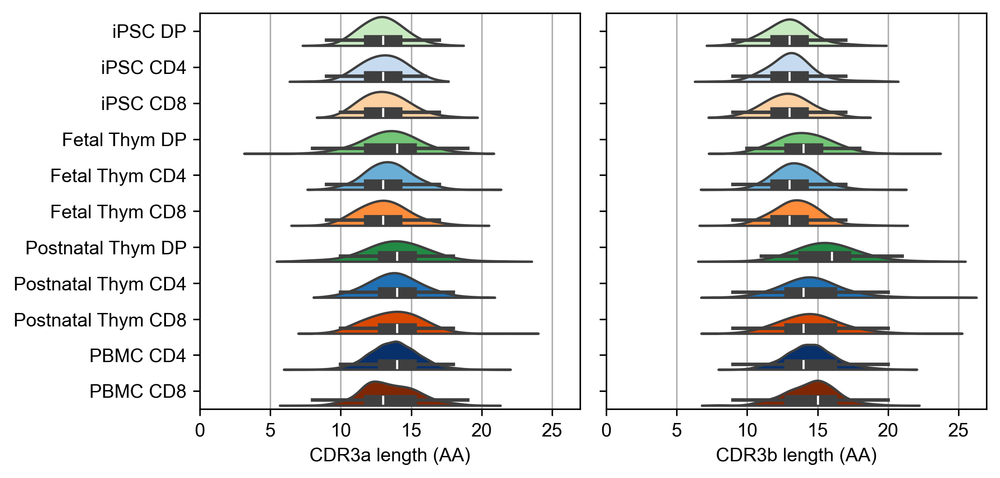

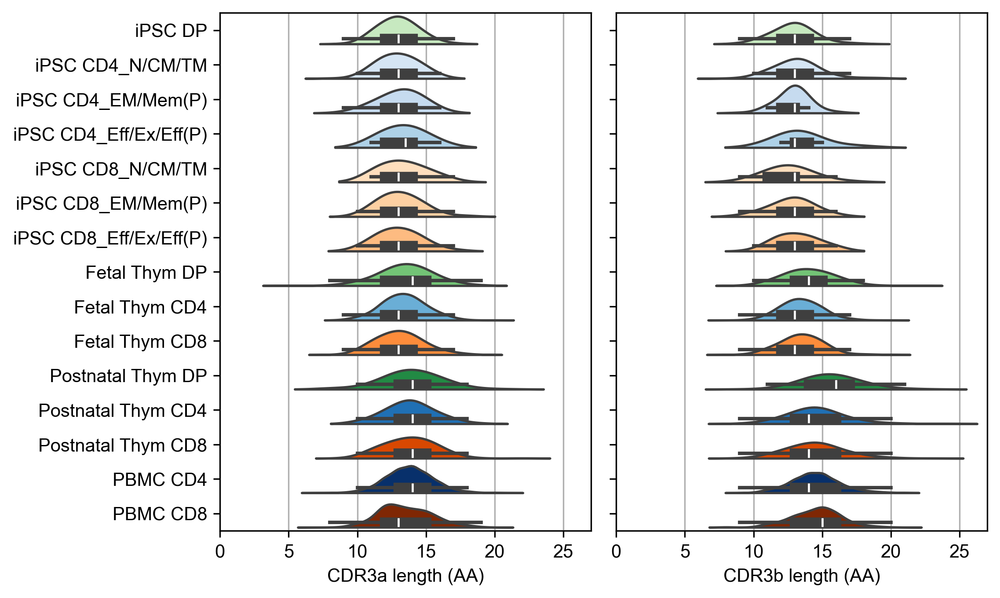

In [ ]:
xlabels = {'CDR3_A AA': 'CDR3a length (AA)', 'CDR3_B AA': 'CDR3b length (AA)'}

for plotname, plotinfo in plots.items():
        
    order = orders[plotname]

    fig, axs = plt.subplots(1, 2, figsize = (6.5, plotinfo['FigH']), sharey = True)
    fig.tight_layout(w_pad = 0)

    for xi, xdata in enumerate(xlabels):
        
        # fig, ax = plt.subplots(1, 1, figsize = (4, 5))
        ax = axs[xi]
        
        # ax = sns.histplot(ax = ax, data = df, x = xdata, y = 'Subset Cell Type')#, # order = order, 
                        #   bins = np.arange(0, 27.5, 1), kde = False, stat = 'density', common_norm = False)#, palette = palette)

        sns.violinplot(ax = ax, data = df, x = xdata, y = plotinfo['Subset'], split = True,
                    order = order, inner = 'box', density_norm = 'area', bw_method = 'scott', bw_adjust = 1.7, inner_kws = {'linewidth': 0})#, palette = palette)

        # ax.grid(visible = True, axis = 'y')
        # ax.set_xticklabels(ax.get_xticklabels(), rotation = 45, ha = 'right')
        # ax.set(ylim = [0, 27], xlabel = None, ylabel = 'CDR3a AA', axisbelow = True) # axisbelow is to ensure the violins are plotted on top of the gridlines -_-
        ax.grid(visible = True, axis = 'x')
        ax.set(xlim = [0, 27], ylabel = None, xlabel = xlabels[xdata], axisbelow = True) # axisbelow is to ensure the violins are plotted on top of the gridlines -_-
        
        # Loop through the created violins and change their color
        for vi, violin in enumerate(ax.findobj(PolyCollection)):
            
            violin.set_facecolor(get_color(order[vi]))
        
        # fig.savefig(PATH_FIG_DIR / f'Fig 6b - {xdata} AA.svg',   bbox_inches = 'tight', facecolor = '#ffffff00') # Sets area outside ax to transparent

    fig.savefig(PATH_FIG_DIR / f'Fig 6 - CDR3_AB AA {plotname}.svg', bbox_inches = 'tight', facecolor = '#ffffff00') # Sets area outside ax to transparent

    plt.show()

### Compare diversity metrics

#### Diversity functions

**Shannon Entropy** ($f$ = frequency of each clone): 

$H(f) = -\sum f_i \cdot log_2(f_i)$

Normalized for length ($T$ = total # TCRs clones):

$H(f) = \frac{-1}{log_2(T)} \sum f_i \cdot log_2(f_i)$

**Simpson's Diversity** ($n$ = number of templates for each clone -- https://www.statology.org/simpsons-diversity-index)
* Interpreted as the unbiased probability of sampling the same thing twice
* N = total number of templates (sequencing reads)

$D = \frac{1}{N \cdot (N - 1)} \cdot \sum_{i=0}^T n_i \cdot (n_i - 1)$

This can be inverted to **Simpson's Index** ($1-D$) to make it so larger numbers mean higher diversity, which is more intuitive and aligns with the format of Shannon entropy.

**Simpson clonality**, as specified by [Adaptive Bio](https://www.adaptivebiotech.com/wp-content/uploads/2020/06/immunoSEQ_Analyzer-Tech-Note_Clonality_WEB_MRK-00355.pdf), is the square root of Simpson's Diversity:

$C = \sqrt{D}$

The variance can be estimated in an unbiased manner by taking a higher moment (see Andreas Tiffeau-Meyer's [paper](doi.org/10.1103/PhysRevE.109.064411))

$var(D) = \frac{a}{1-b} \cdot D_T - \frac{b}{1-b} \cdot D^2 + \frac{c}{1-b} \cdot D$

$D_T = \frac{1}{N \cdot (N - 1) \cdot (N - 2)} \cdot \sum_{i=0}^T n_i \cdot (n_i - 1) \cdot (n_i - 2)$

$a = \frac{4(N-2)}{N(N-1)}, b = \frac{2(2N-3)}{N(N-1)}, c = \frac{2}{N(N-1)}$

In [69]:
def shannon(n, normalize = False):
    # n should be a vector of counts (optional: probabilities with sum = 1)
    # Optional normalization input normalizes for the number of elements sampled
    
    # convert n to  porbability vector
    if type(n) == list:
        n = np.array(n)
    f = n / sum(n)
    entropy = -sum(f * np.log2(f))

    # Normalize for length of n
    if normalize:
        entropy /= np.log2(len(f))
    
    return entropy

def simpson(n, metric = 'diversity'):
    # Unbiased estimator of sample diversity. Metrics:
    # - 'diversity' (Default): Simpson's Diversity Index -- smaller # = more diverse
    # - 'index':               Simpson's Index of Diversity (1 - Diversity) -- larger # = more diverse
    # - 'clonality':           Simpson Clonality (sqrt of Diversity) -- as computed by Adaptive Bio
    
    if type(n) == list:
        n = np.array(n)
    N = sum(n)
    D = sum(n * (n - 1)) / (N * (N - 1))
    
    metric = metric.lower()
    if metric in ['div', 'diversity', 'diversity index']:
        return D
    elif metric in ['ind', 'index', 'index of diversity']:
        return 1 - D
    elif metric in ['clon', 'clonality']:
        return np.sqrt(D)
    else:
        raise Exception(f'Invalid metric: {metric}') 

def simpson_var(n, mode = 'variance'):
    # Higher moment of Simpson diversity index. Modes:
    # - 'variance' (Default): Variance estimate
    # - 'std':                Standard deviation estimate (sqrt(Variance))

    
    if type(n) == list:
        n = np.array(n)
    N = sum(n)
    D = sum(n * (n - 1)) / (N * (N - 1))
    D_T = sum(n * (n - 1) * (n - 2)) / (N * (N - 1) * (N - 2))
    a = 4 *   (N - 2) / (N * (N - 1))
    b = 2 * (2*N - 3) / (N * (N - 1))
    c = 2             / (N * (N - 1))
    D_var = a / (1 - b) * D_T - b / (1 - b) * D**2 + c / (1 - b) * D
    
    mode = mode.lower()
    if mode in ['var', 'variance']:
        return D_var
    elif mode in ['std', 'stdev', 'standard deviation']:
        return np.sqrt(D_var)
    else:
        raise Exception(f'Invalid mode: {metric}')
    

# shannon(subsets['CVJ']['Thym']['Templates'], normalize = True)


#### Plots

In [408]:
array = [2] * 50
# [array.append(x) for x in [2] * 5]
# [array.append(x) for x in [0] * 0]
print(f'Shannon: {shannon(array, True)}')
print(f'Simpson: {simpson(array, "div")}')

Shannon: 1.0000000000000007
Simpson: 0.010101010101010102


In [70]:
df_counts_vjca.loc['iPSC CD4', :].dropna() # confirming the values are not uniform but non-1, which would inflate Simpson Diversity

CDR3_A           VA             JA       
CAAGTYKYIF       TRAV29-01/DV5  TRAJ40-01    1.0
CAAIGNEKLTF      TRAV29-01/DV5  TRAJ48-01    3.0
CAAISNFGNEKLTF   TRAV29-01/DV5  TRAJ48-01    1.0
CAAITQGGSEKLVF   TRAV23-01/DV6  TRAJ57-01    1.0
CAAKNYGGSQGNLIF  TRAV29-01/DV5  TRAJ42-01    1.0
                                            ... 
CVVNTGNQFYF      TRAV12-01      TRAJ49-01    1.0
CVVSDNFNKFYF     TRAV08-02      TRAJ21-01    1.0
CVVSDNYGQNFVF    TRAV08-02      TRAJ26-01    1.0
CVVSNDYKLSF      TRAV10-01      TRAJ20-01    1.0
CVVSNNAGNMLTF    TRAV10-01      TRAJ39-01    1.0
Name: iPSC CD4, Length: 183, dtype: float64

PBMC CD8: len: 1631, sum: 2357.0, entropy: 0.931290585361261, sindex: 0.997183190914179, sdiversity: 0.002816809085821048
PBMC CD4: len: 4359, sum: 4617.0, entropy: 0.989926931761166, sindex: 0.9998310816517512, sdiversity: 0.00016891834824883656
Postnatal Thym CD8: len: 257, sum: 257.0, entropy: 1.0, sindex: 1.0, sdiversity: 0.0
Postnatal Thym CD4: len: 263, sum: 263.0, entropy: 1.0, sindex: 1.0, sdiversity: 0.0
Postnatal Thym DP: len: 174, sum: 174.0, entropy: 1.0, sindex: 1.0, sdiversity: 0.0
Fetal Thym CD8: len: 800, sum: 830.0, entropy: 0.9973718199313093, sindex: 0.9998895461217608, sdiversity: 0.00011045387823915842
Fetal Thym CD4: len: 861, sum: 893.0, entropy: 0.9977022307354929, sindex: 0.9999096108748161, sdiversity: 9.038912518388731e-05
Fetal Thym DP: len: 574, sum: 586.0, entropy: 0.998507119426369, sindex: 0.9999183221026224, sdiversity: 8.167789737756337e-05
iPSC CD8: len: 193, sum: 453.0, entropy: 0.9165162463137847, sindex: 0.9890992205356619, sdiversity: 0.0109007794

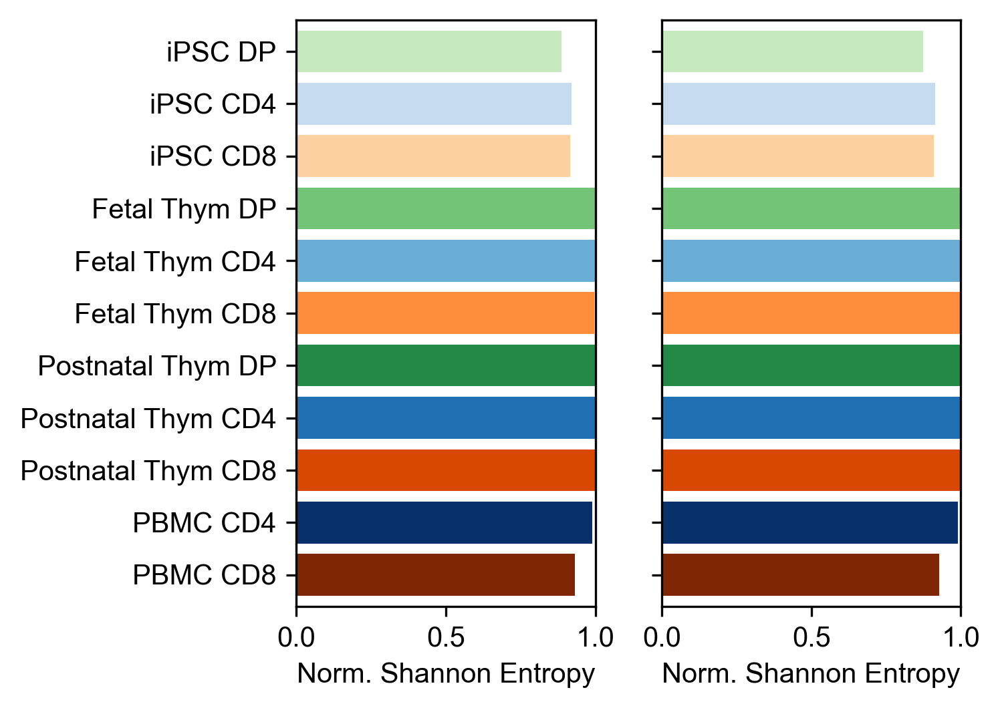

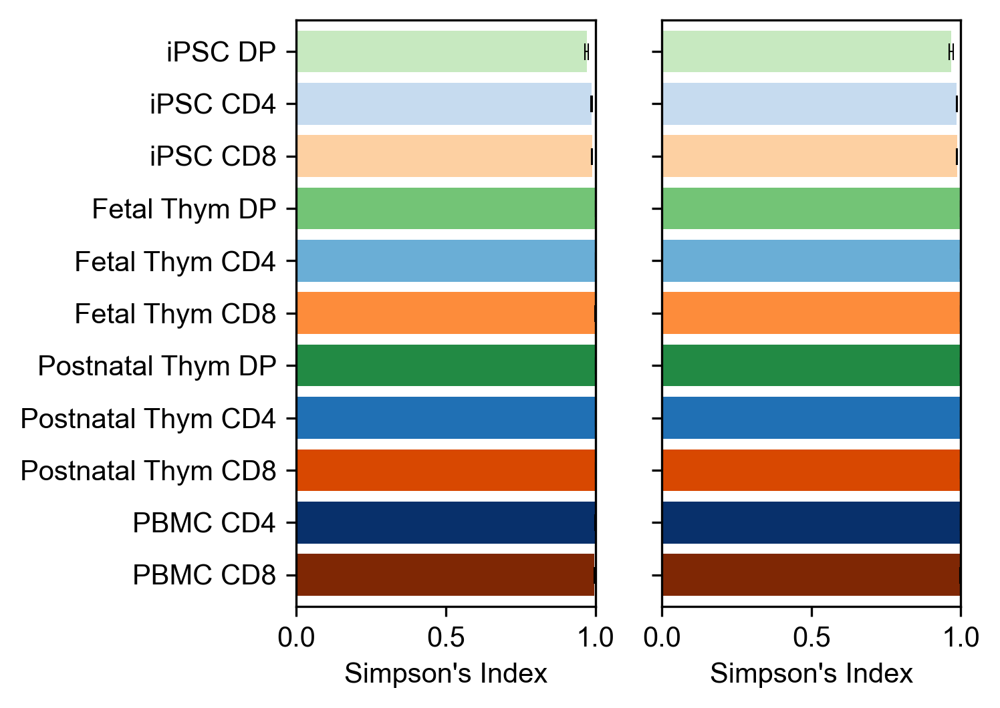

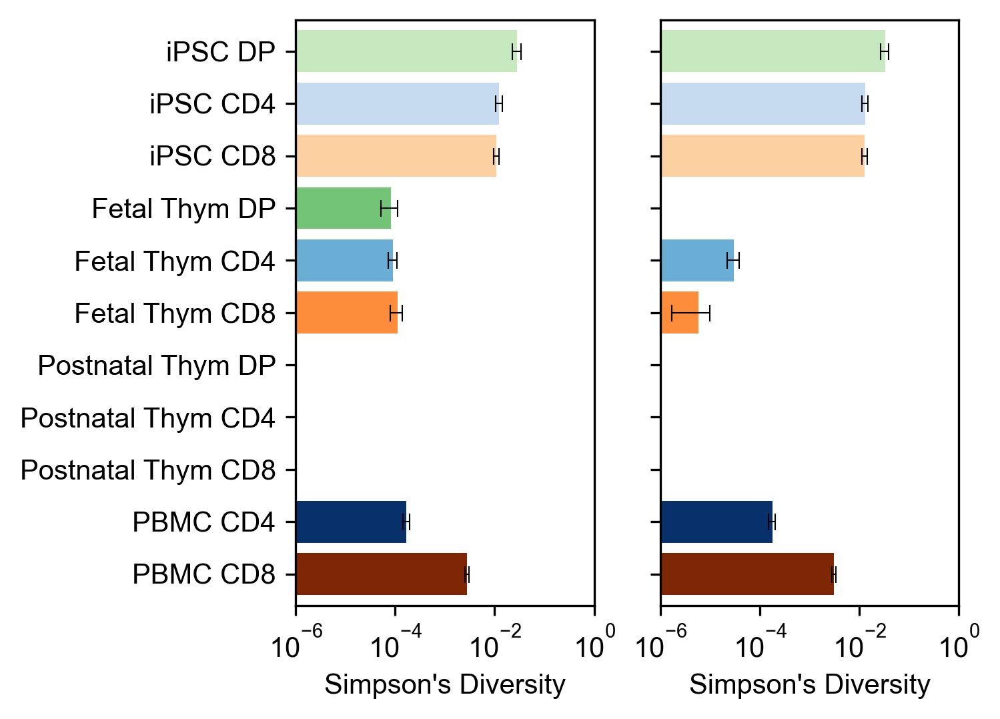

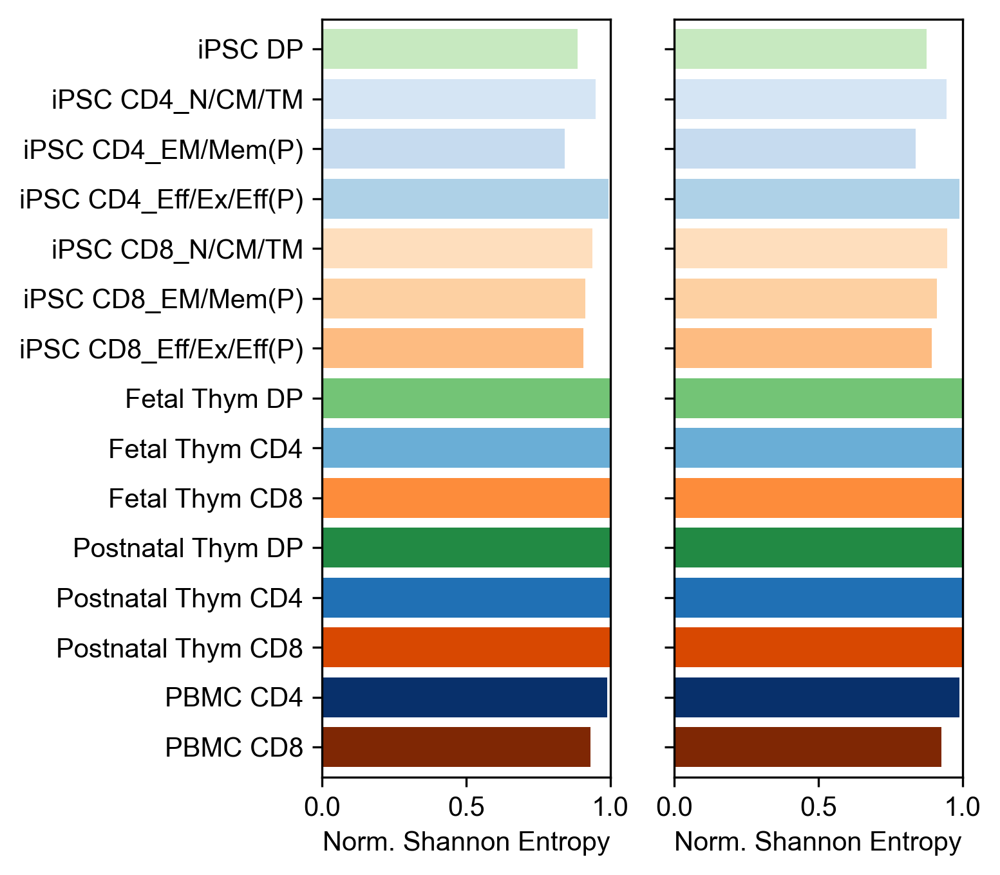

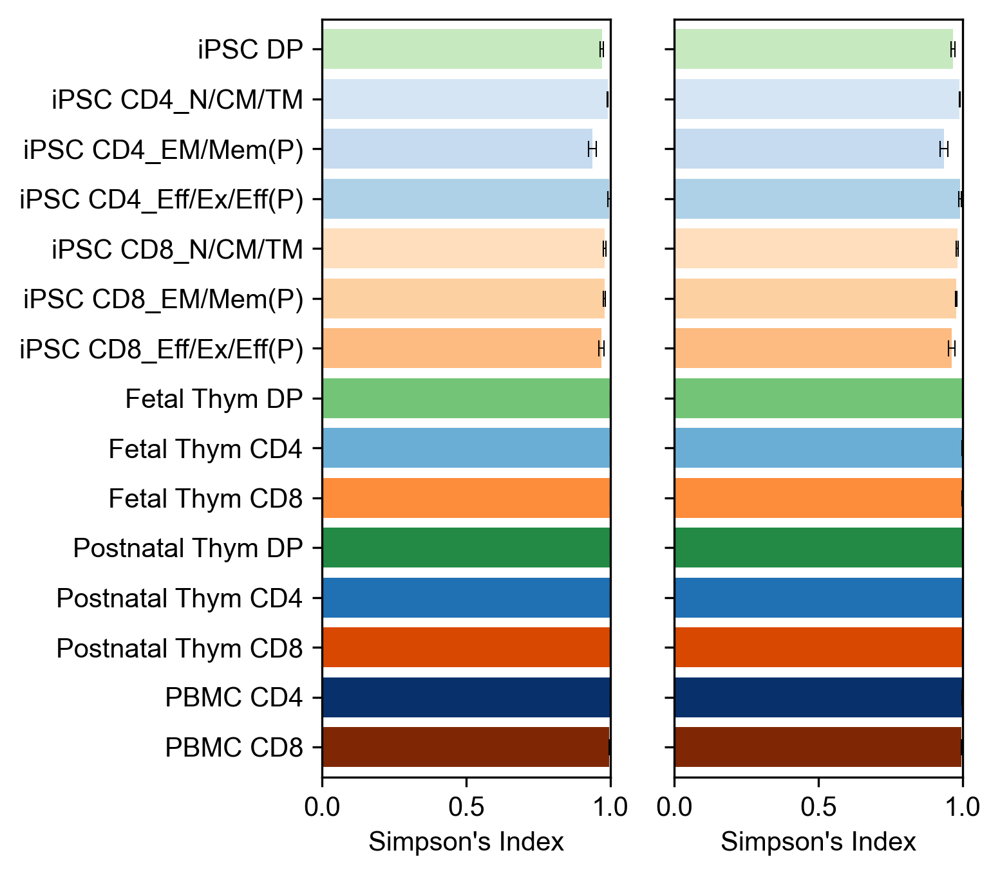

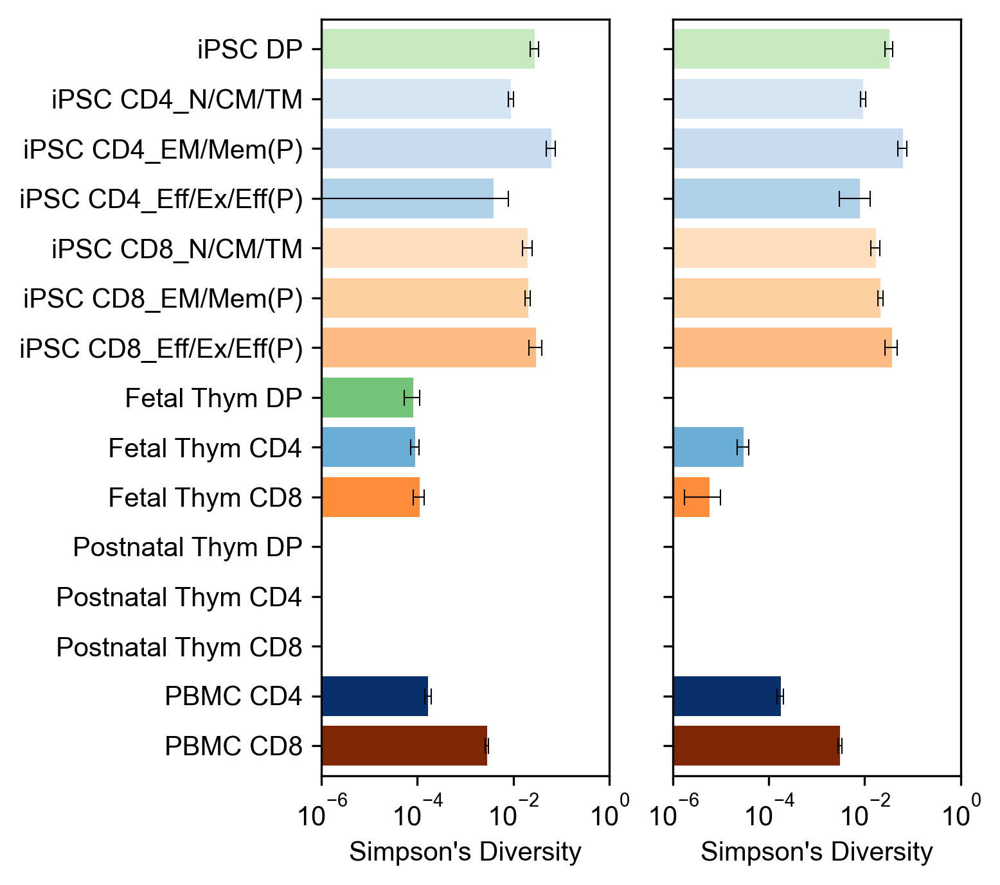

In [ ]:
for plotname, plotinfo in plots.items():
    
    order = np.flip(orders[plotname])

    # Compute + plot
    fige, axse = plt.subplots(1, 2, figsize = (4, plotinfo['FigH']), sharey = True)
    fige.tight_layout(w_pad = 1)

    figi, axsi = plt.subplots(1, 2, figsize = (4, plotinfo['FigH']), sharey = True)
    figi.tight_layout(w_pad = 1)

    figd, axsd = plt.subplots(1, 2, figsize = (4, plotinfo['FigH']), sharey = True)
    figd.tight_layout(w_pad = 1)

    df_counts_vjca_curr = df.pivot_table(values = 'Templates', index = plotinfo['Subset'], columns = ['CDR3_A', 'VA', 'JA'], aggfunc = 'sum')
    df_counts_vjcb_curr = df.pivot_table(values = 'Templates', index = plotinfo['Subset'], columns = ['CDR3_B', 'VB', 'JB'], aggfunc = 'sum')

    for di, df_vjc in enumerate([df_counts_vjca_curr, df_counts_vjcb_curr]):
    # for di, df_vjc in enumerate([df_counts_ab]):
        
        axe = axse[di]
        axi = axsi[di]
        axd = axsd[di]
        bar_counters = [0, 0]
        
        for subname in order:
            
            color = get_color(subname)
            
            data = df_vjc.loc[subname, :]
            data = data[data.notna()] # do this rather than filling na values w/ 0 due to log of 0 error in Shannon entropy calc
            
            # We have to do the calculation here as now we're sometimes collapsing multiple samples within the subset
            entropy = shannon(data, normalize = True)
            sindex = simpson(data, metric = 'index')
            sdiversity = 1 - sindex
            print(f'{subname}: len: {len(data)}, sum: {sum(data)}, entropy: {entropy}, sindex: {sindex}, sdiversity: {sdiversity}')
            sindex_std = simpson_var(data, mode = 'std')
            
            axe.barh(bar_counters[di], entropy, color = color)
            
            axi.barh(bar_counters[di], sindex, color = color)
            # axe.barh(bar_counters[di], np.mean(entropy),   xerr = np.std(entropy,   ddof = 1), capsize = 3, error_kw = {'elinewidth': 0.5, 'capthick': 0.5}, color = color)
            axi.barh(bar_counters[di], sindex, xerr = sindex_std, capsize = 3, error_kw = {'elinewidth': 0.5, 'capthick': 0.5}, color = color)
            
            axd.barh(bar_counters[di], sdiversity, color = color)
            axd.barh(bar_counters[di], sdiversity, xerr = sindex_std, capsize = 3, error_kw = {'elinewidth': 0.5, 'capthick': 0.5}, color = color)
            
            bar_counters[di] += 1
        
            # # Bootstrap calculations (repeat subsampling 1/5 of the points, ten times)
            # entropy = []
            # sindex = []
            # for i in range(10):
            #     rng = np.random.default_rng(seed = i)
            #     subsample = rng.choice(data, int(len(data) / 5), replace = False)
            #     entropy.append(shannon(subsample, normalize = True))
            #     sindex.append(simpson(subsample, sqrt = True))
            # axe.barh(bar_counters[di], np.mean(entropy),   xerr = np.std(entropy,   ddof = 1), capsize = 3, error_kw = {'elinewidth': 0.5, 'capthick': 0.5}, color = color)
            # axi.barh(bar_counters[di], np.mean(sindex), xerr = np.std(sindex, ddof = 1), capsize = 3, error_kw = {'elinewidth': 0.5, 'capthick': 0.5}, color = color)
            # bar_counters[di] += 1

        axe.set(xlim = [0, 1], ylim = [-0.6, len(order) - 0.4])
        axe.set_yticks(np.arange(len(order)))
        axe.set_yticklabels(order)#, fontsize = 10)#, rotation = 45, ha = 'right')
        axe.set_xlabel('Norm. Shannon Entropy')#, fontsize = 12)
        
        axi.set(xlim = [0, 1], ylim = [-0.6, len(order) - 0.4])
        axi.set_yticks(np.arange(len(order)))
        axi.set_yticklabels(order)#, fontsize = 10)#, rotation = 45, ha = 'right')
        axi.set_xlabel("Simpson's Index")#, fontsize = 12)

        axd.set(xscale = 'log', xticks = [1e-6, 1e-4, 1e-2, 1e0], xlim = [1e-6, 1], ylim = [-0.6, len(order) - 0.4])
        axd.set_yticks(np.arange(len(order)))
        axd.set_yticklabels(order)#, fontsize = 10)#, rotation = 45, ha = 'right')
        axd.set_xlabel("Simpson's Diversity")#, fontsize = 12)

        
    fige.savefig(PATH_FIG_DIR / f'Fig 6 - Shannon entropy {plotname}.svg',   bbox_inches = 'tight', facecolor = '#ffffff00') # Sets area outside ax to transparent
    figi.savefig(PATH_FIG_DIR / f'Fig 6 - Simpson index {plotname}.svg',     bbox_inches = 'tight', facecolor = '#ffffff00') # Sets area outside ax to transparent
    figd.savefig(PATH_FIG_DIR / f'Fig 6 - Simpson diversity {plotname}.svg', bbox_inches = 'tight', facecolor = '#ffffff00') # Sets area outside ax to transparent


### Compare TCR fragment usages

Compare fractional usages: PSC vs CB vs thymocytes vs PBMCs

Z-score across rows and cols to compare relative usages

#### PCA

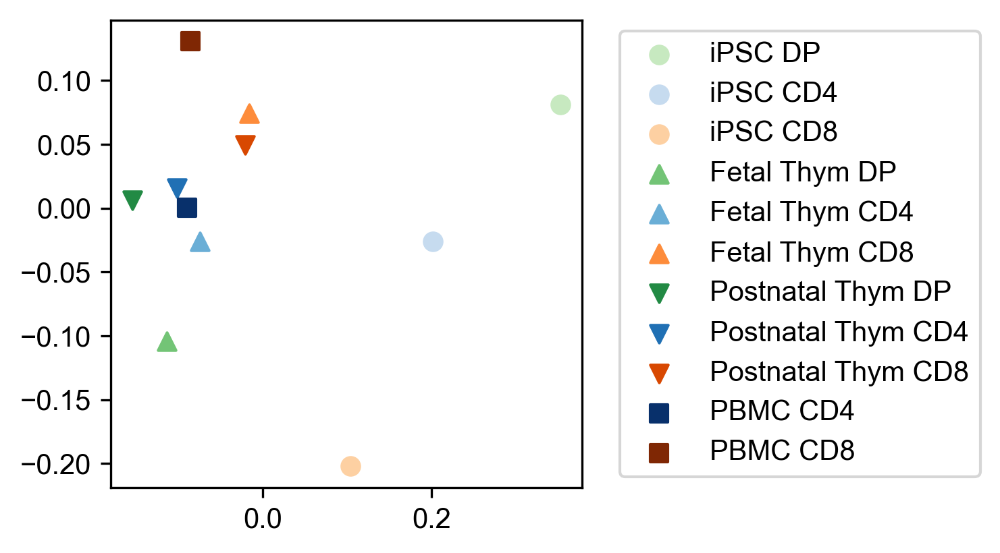

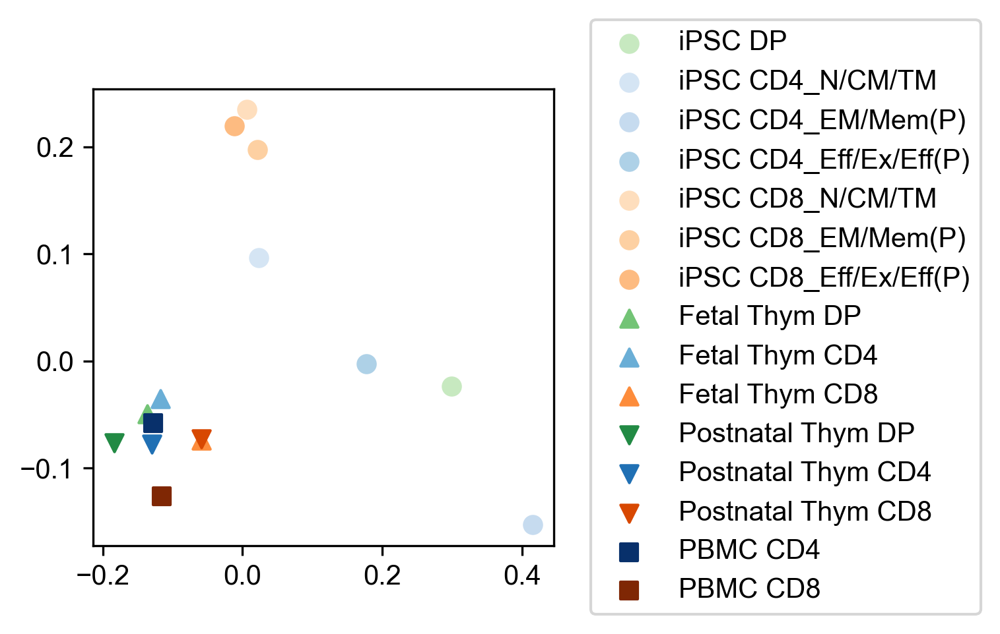

In [ ]:
cols = [TRBV, TRBJ, TRAV, TRAJ]
pca = PCA(n_components = 2)

for plotname, plotinfo in plots.items():

    order = orders[plotname]

    df_counts_va_curr = df.pivot_table(values = 'Templates', index = plotinfo['Subset'], columns =  'VA', aggfunc = 'sum', fill_value = 0)
    df_counts_ja_curr = df.pivot_table(values = 'Templates', index = plotinfo['Subset'], columns =  'JA', aggfunc = 'sum', fill_value = 0)
    df_counts_vb_curr = df.pivot_table(values = 'Templates', index = plotinfo['Subset'], columns =  'VB', aggfunc = 'sum', fill_value = 0)
    df_counts_jb_curr = df.pivot_table(values = 'Templates', index = plotinfo['Subset'], columns =  'JB', aggfunc = 'sum', fill_value = 0)

    # Fit PCA on concatenated data for each cell type (rows = cell types, cols = all TCR segments)
    data = []
    for di, df_x in enumerate([df_counts_vb_curr, df_counts_jb_curr, df_counts_va_curr, df_counts_ja_curr]):
        
        # Normalize segment frequencies
        data.append(df_x.copy().reindex(order, columns = cols[di]).fillna(0).apply(lambda x: x / x.sum(), axis = 1))
        
    seg_pca = pca.fit_transform(pd.concat(data, axis = 1))
    df_seg_pca = pd.DataFrame(seg_pca, index = order)

    fig, axs = plt.subplots(1, 1, figsize = (3, 3))

    for subname in order:
        
        axs.scatter(df_seg_pca.loc[subname, 0], df_seg_pca.loc[subname, 1], marker = get_marker(subname), s = 40, color = get_color(subname))

    # axs.set(xlabel = 'Principal Component 1', ylabel = 'Principal Component 2')

    plt.legend(order, loc = 'center left', bbox_to_anchor = (1.05, 0.5))

    fig.savefig(PATH_FIG_DIR / f'Fig 6 - Segment PCA {plotname}.svg', bbox_inches = 'tight', facecolor = '#ffffff00') # Sets area outside ax to transparent
    plt.show()

#### Densities

S: A smoothing condition. The amount of smoothness is determined by satisfying the conditions: sum((w * (y - g))**2,axis=0) <= s, where g(x) is the smoothed interpolation of (x,y). The user can use s to control the trade-off between closeness and smoothness of fit. Larger s means more smoothing while smaller values of s indicate less smoothing. Recommended values of s depend on the weights, w. If the weights represent the inverse of the standard-deviation of y, then a good s value should be found in the range (m-sqrt(2*m),m+sqrt(2*m)), where m is the number of data points in x, y, and w.

In [231]:
(len(y) - np.sqrt(2*len(y)))*np.std(y)


0.5302920363927878

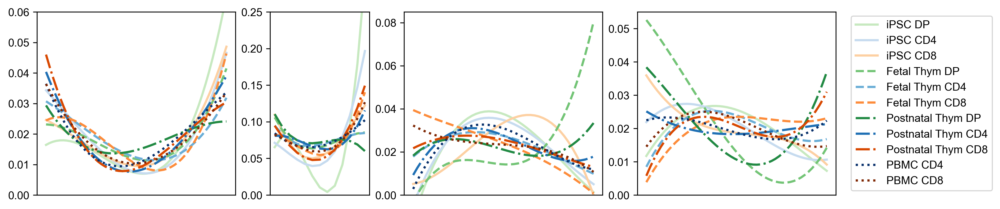

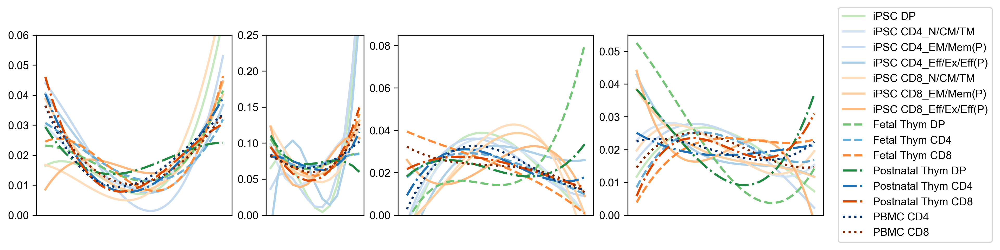

In [ ]:
ylims = [(0, 0.06), (0, 0.25), (0, 0.085), (0, 0.055)]
cols = [TRBV, TRBJ, TRAV, TRAJ]

for plotname, plotinfo in plots.items():

    order = orders[plotname]

    df_counts_va_curr = df.pivot_table(values = 'Templates', index = plotinfo['Subset'], columns =  'VA', aggfunc = 'sum', fill_value = 0)
    df_counts_ja_curr = df.pivot_table(values = 'Templates', index = plotinfo['Subset'], columns =  'JA', aggfunc = 'sum', fill_value = 0)
    df_counts_vb_curr = df.pivot_table(values = 'Templates', index = plotinfo['Subset'], columns =  'VB', aggfunc = 'sum', fill_value = 0)
    df_counts_jb_curr = df.pivot_table(values = 'Templates', index = plotinfo['Subset'], columns =  'JB', aggfunc = 'sum', fill_value = 0)

    f, axs = plt.subplots(1, 4, figsize = (13, 3), width_ratios = [1, 0.5, 1, 1])
    # f.tight_layout(w_pad = 0)
    
    for di, df_y in enumerate([df_counts_vb_curr, df_counts_jb_curr, df_counts_va_curr, df_counts_ja_curr]):
        
        ax = axs[di]
        data = df_y.copy().reindex(order, columns = cols[di]).fillna(0).apply(lambda x: x / x.sum(), axis = 1)
        
        for subname in order:
                
            # if ('immature' in subname) or ('(P)' in subname):
            #     linestyle = 'dotted' # overwrite for these to separate 4_imm vs 4_mat and DP vs DP (P)
            
            y = data.loc[subname, :]
            w = [1 / np.std(y)] * len(y)
            x = np.arange(len(y))
            tck = splrep(x, y, w, s = len(y))#, s = len(y) - np.sqrt(2*len(y)))
            y_spline = BSpline(*tck)(x)
            
            ax.plot(x, y_spline, linewidth = 2, linestyle = get_linestyle(subname), color = get_color(subname))
        
        ax.set(xlabel = '', ylabel = '', xticks = [], ylim = ylims[di])
        # ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)

    plt.legend(order, loc = 'center left', bbox_to_anchor = (1.05, 0.5))

    f.savefig(PATH_FIG_DIR / f'Fig 6 - Position density {plotname}.svg', bbox_inches = 'tight', facecolor = '#ffffff00') # Sets area outside ax to transparent
    plt.show()

#### Va + Vb

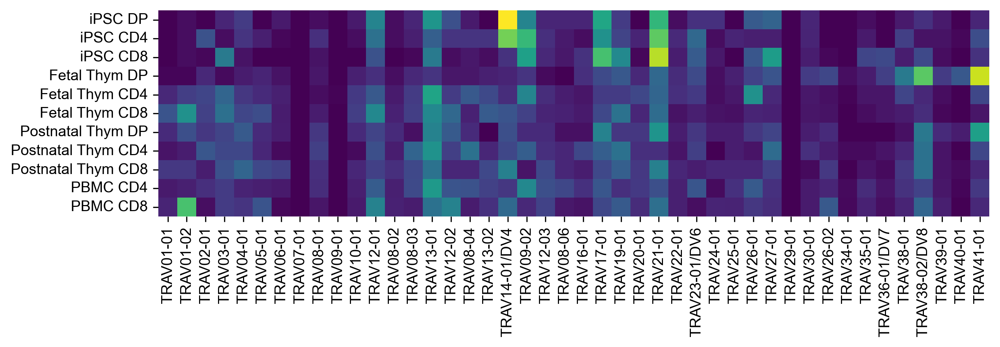

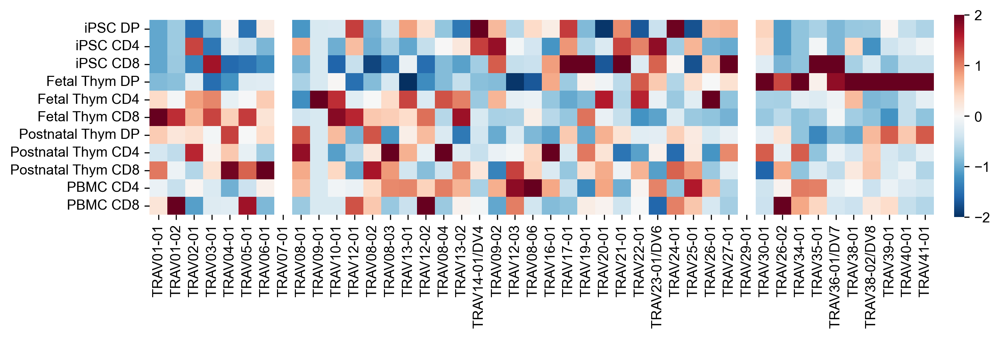

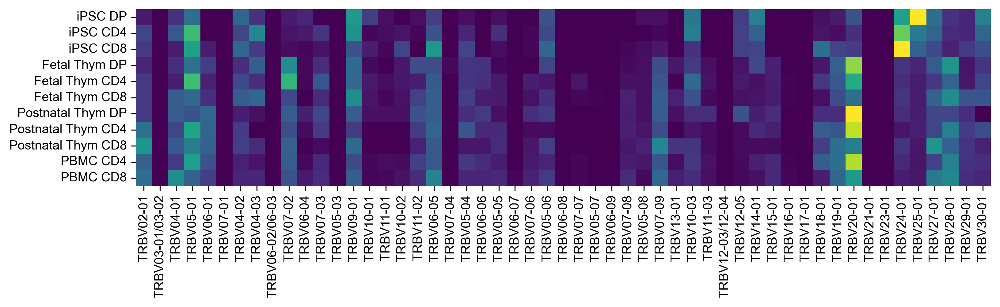

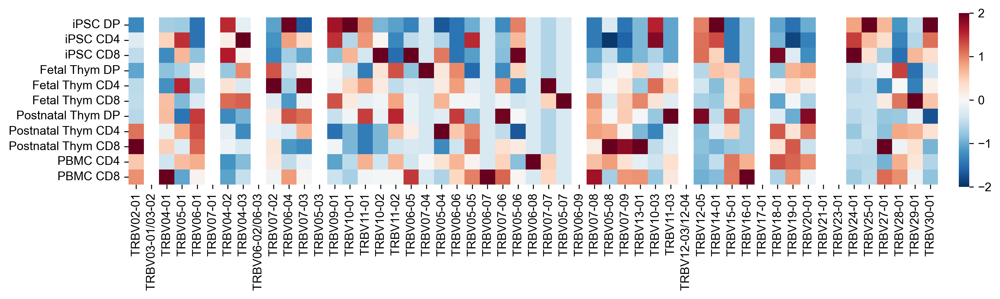

In [ ]:
plotname = 'Simple'
order = orders[plotname]

figW = [10, 12]
figH = 2.5
cbar_pos = [.92, 0.1, .01, 0.8]

cols = [TRAV, TRBV]
labels = ['Va', 'Vb']

for di, df_v in enumerate([df_counts_va, df_counts_vb]):
    
    data = df_v.copy().reindex(order, columns = cols[di]).fillna(0).apply(lambda x: x / x.sum(), axis = 1)

    # Fractional counts per sample
    f, ax = plt.subplots(figsize = (figW[di], figH), ncols = 1, nrows = 1)
    # cbar_ax = f.add_axes(cbar_pos)

    sns.heatmap(ax = ax, data = data, annot = False, linewidths = 0.0, fmt = '.3g', vmin = 0, vmax = 0.15, \
                cmap = 'viridis', cbar = False) #cbar_ax = cbar_ax, 
    ax.set(xlabel = '', ylabel = '')
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)
    
    f.savefig(PATH_FIG_DIR / f'Fig 6 - {labels[di]} {plotname}.svg', bbox_inches = 'tight', facecolor = '#ffffff00') # Sets area outside ax to transparent


    # Z-score by column
    f, ax = plt.subplots(figsize = (figW[di], figH), ncols = 1, nrows = 1)
    cbar_ax = f.add_axes(cbar_pos)

    sns.heatmap(ax = ax, data = data.apply(stats.zscore, axis = 0), annot = False, linewidths = 0.0, fmt = '.3g', vmin = -2, vmax = 2, \
                cbar_ax = cbar_ax, cmap = 'RdBu_r')
    ax.set(xlabel = '', ylabel = '')
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)


    # Z-score by row
    # f, ax = plt.subplots(figsize = (figW[di], figH), ncols = 1, nrows = 1)
    # cbar_ax = f.add_axes(cbar_pos)

    # sns.heatmap(ax = ax, data = data.apply(stats.zscore, axis = 1), annot = False, linewidths = 0.0, fmt = '.3g', vmin = -2, vmax = 2, \
    #             cbar_ax = cbar_ax, cmap = 'RdBu_r')
    # ax.set(xlabel = '', ylabel = '')
    # ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)


plt.show()

#### Ja + Jb

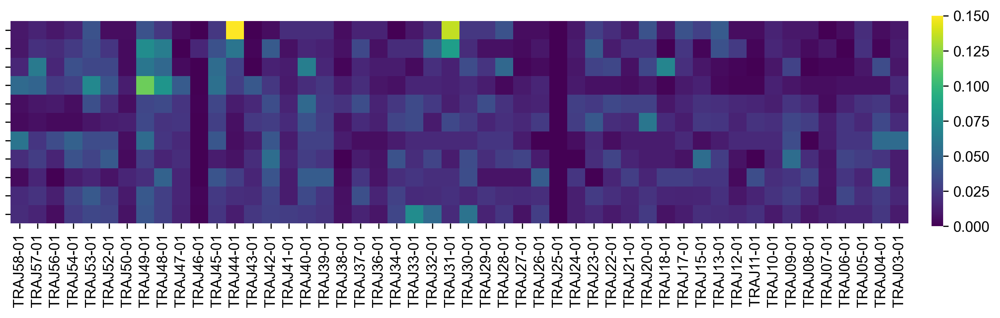

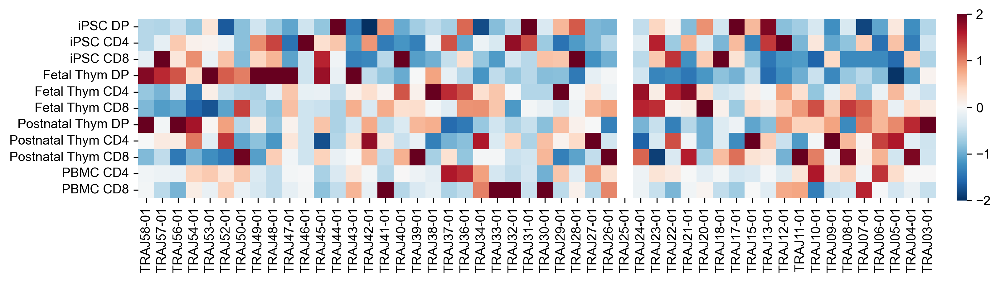

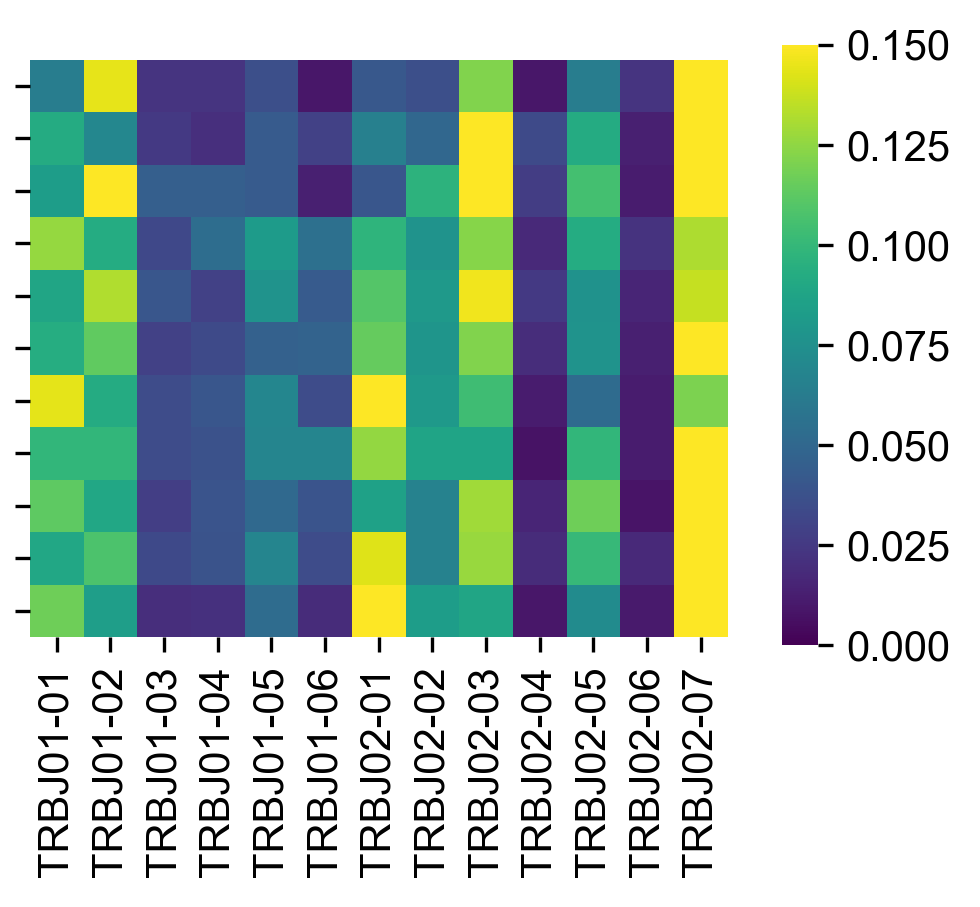

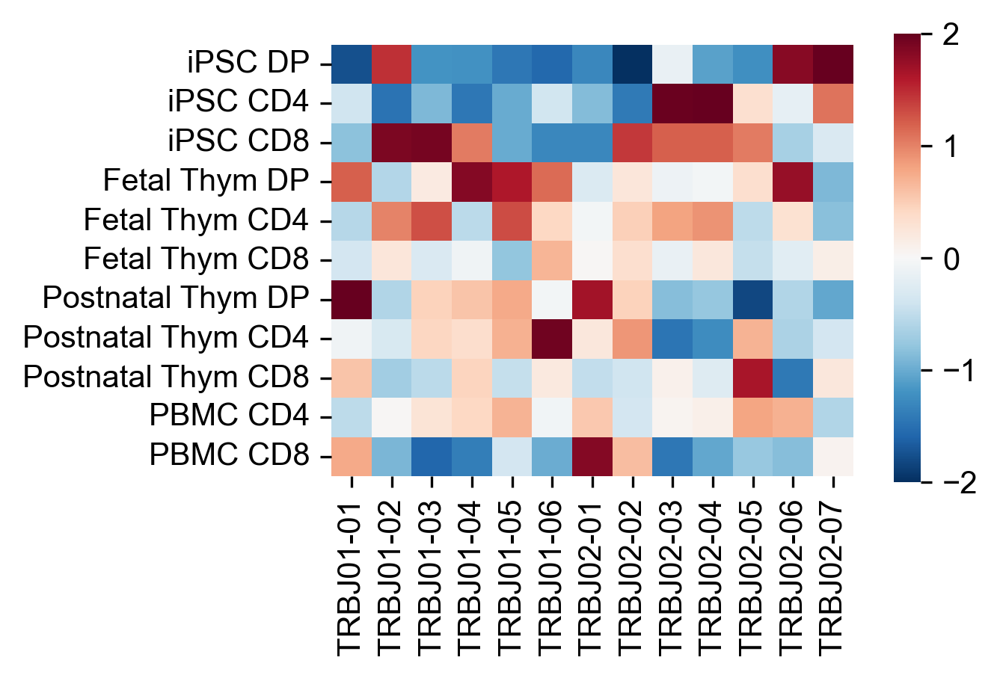

In [ ]:
plotname = 'Simple'
order = orders[plotname]

figW = [11, 3]
figH = 2.5
cbar_pos = [[.92, 0.1, .01, 0.8], 
            [.96, 0.1, .04, 0.8]]

cols = [TRAJ, TRBJ]
labels = ['Ja', 'Jb']

for di, df_j in enumerate([df_counts_ja, df_counts_jb]):
    
    data = df_j.copy().reindex(order, columns = cols[di]).fillna(0).apply(lambda x: x / x.sum(), axis = 1)

    # Fractional counts per sample
    f, ax = plt.subplots(figsize = (figW[di], figH), ncols = 1, nrows = 1)
    cbar_ax = f.add_axes(cbar_pos[di])
    
    sns.heatmap(ax = ax, data = data, annot = False, linewidths = 0.0, fmt = '.3g', vmin = 0, vmax = 0.15, \
                cbar_ax = cbar_ax, cmap = 'viridis')
    ax.set(xlabel = '', ylabel = '', yticklabels = [])
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)

    f.savefig(PATH_FIG_DIR / f'Fig 6 - {labels[di]} {plotname}.svg', bbox_inches = 'tight', facecolor = '#ffffff00') # Sets area outside ax to transparent
    

    # Z-score by column
    f, ax = plt.subplots(figsize = (figW[di], figH), ncols = 1, nrows = 1)
    cbar_ax = f.add_axes(cbar_pos[di])

    sns.heatmap(ax = ax, data = data.apply(stats.zscore, axis = 0), annot = False, linewidths = 0.0, fmt = '.3g', vmin = -2, vmax = 2, \
                cbar_ax = cbar_ax, cmap = 'RdBu_r')
    ax.set(xlabel = '', ylabel = '')
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)


    # Z-score by row
    # f, ax = plt.subplots(figsize = (figW[di], figH), ncols = 1, nrows = 1)
    # cbar_ax = f.add_axes(cbar_pos[di])

    # sns.heatmap(ax = ax, data = data.apply(stats.zscore, axis = 1), annot = False, linewidths = 0.0, fmt = '.3g', vmin = -2, vmax = 2, \
    #             cbar_ax = cbar_ax, cmap = 'RdBu_r')
    # ax.set(xlabel = '', ylabel = '')
    # ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)


plt.show()

### Compare 4SP vs 8SP biased fragments

Divide relative frequencies in CD4 / CD8 for each of iPSC-T cells, thymocytes, and PBMCs, then compare

#### Va + Vb

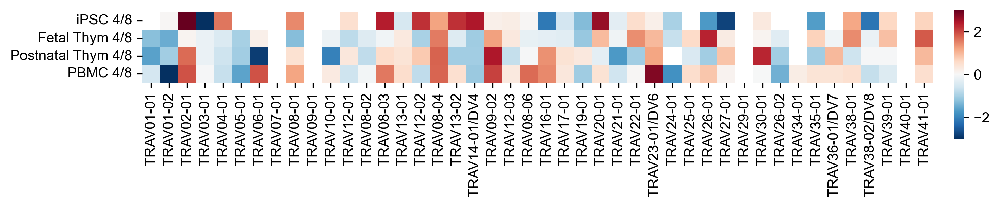

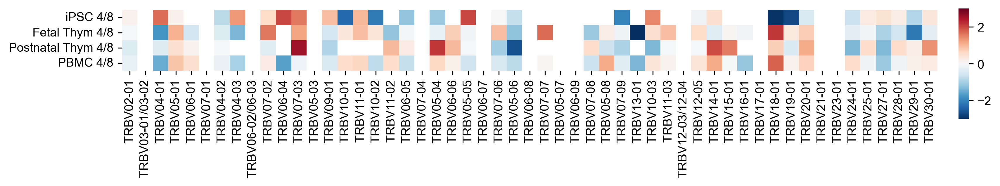

In [98]:
order = ['iPSC 4/8', 'Fetal Thym 4/8', 'Postnatal Thym 4/8', 'PBMC 4/8']

figW = [10, 12]
figH = 0.9
cbar_pos = [.92, -.5, .01, 1.4]

cols = [TRAV, TRBV]

for di, df_v in enumerate([df_counts_va, df_counts_vb]):
    
    data = df_v.copy().fillna(0).apply(lambda x: x / x.sum(), axis = 1)
    
    # Get ratio of CD4 / CD8 usages --> aoply back to original dataframe so information can be used later
    df_v.loc['iPSC 4/8'] = data.loc['iPSC CD4'] / data.loc['iPSC CD8']
    df_v.loc['Fetal Thym 4/8'] = data.loc['Fetal Thym CD4'] / data.loc['Fetal Thym CD8']
    df_v.loc['Postnatal Thym 4/8'] = data.loc['Postnatal Thym CD4'] / data.loc['Postnatal Thym CD8']
    df_v.loc['PBMC 4/8'] = data.loc['PBMC CD4'] / data.loc['PBMC CD8']
    
    data = df_v.reindex(order, columns = cols[di]).apply(np.log2)
    
    # Fractional counts per sample
    f, ax = plt.subplots(figsize = (figW[di], figH), ncols = 1, nrows = 1)
    cbar_ax = f.add_axes(cbar_pos)
    
    sns.heatmap(ax = ax, data = data, annot = False, linewidths = 0.0, fmt = '.3g', vmin = -3, vmax = 3, \
                cbar_ax = cbar_ax, cmap = 'RdBu_r', yticklabels = order) # It's auto-suppressing some Y ticks so manually force plotting
    ax.set(xlabel = '', ylabel = '')
    # ax.set_yticklabels(order)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)


plt.show()

#### Ja + Jb

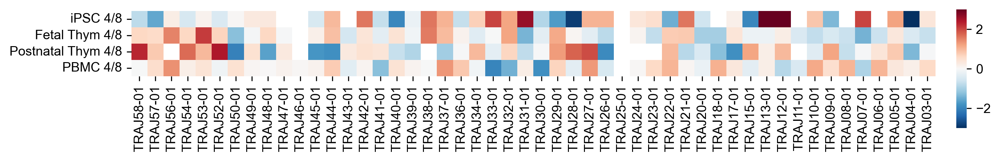

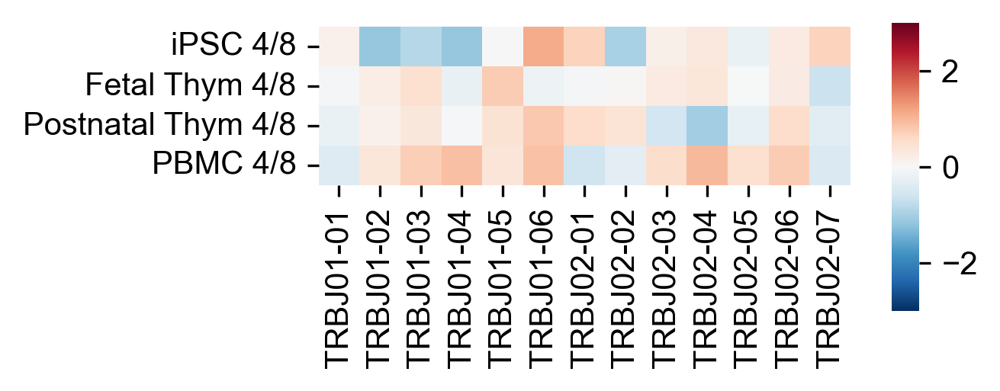

In [99]:
order = ['iPSC 4/8', 'Fetal Thym 4/8', 'Postnatal Thym 4/8', 'PBMC 4/8']

figW = [11, 3]
figH = 0.9
cbar_pos = [[.92, -.5, .01, 1.4], 
            [.96, -.5, .04, 1.4]]

cols = [TRAJ, TRBJ]

for di, df_j in enumerate([df_counts_ja, df_counts_jb]):
    
    data = df_j.copy().fillna(0).apply(lambda x: x / x.sum(), axis = 1)
    
    # Get ratio of CD4 / CD8 usages --> aoply back to original dataframe so information can be used later
    df_j.loc['iPSC 4/8'] = data.loc['iPSC CD4'] / data.loc['iPSC CD8']
    df_j.loc['Fetal Thym 4/8'] = data.loc['Fetal Thym CD4'] / data.loc['Fetal Thym CD8']
    df_j.loc['Postnatal Thym 4/8'] = data.loc['Postnatal Thym CD4'] / data.loc['Postnatal Thym CD8']
    df_j.loc['PBMC 4/8'] = data.loc['PBMC CD4'] / data.loc['PBMC CD8']
    
    data = df_j.reindex(order, columns = cols[di]).apply(np.log2)
    
    # Fractional counts per sample
    f, ax = plt.subplots(figsize = (figW[di], figH), ncols = 1, nrows = 1)
    cbar_ax = f.add_axes(cbar_pos[di])
    
    sns.heatmap(ax = ax, data = data, annot = False, linewidths = 0.0, fmt = '.3g', vmin = -3, vmax = 3, \
                cbar_ax = cbar_ax, cmap = 'RdBu_r', yticklabels = order) # It's auto-suppressing some Y ticks so manually force plotting
    ax.set(xlabel = '', ylabel = '')
    # ax.set_yticklabels(order)
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)


plt.show()

### Compare 4/8 ratios among sample types

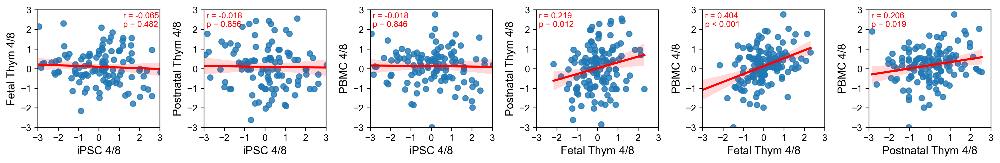

In [103]:
order = ['iPSC 4/8', 'Fetal Thym 4/8', 'Postnatal Thym 4/8', 'PBMC 4/8']

# Compile together all ratios from all fragments
# --> transpose so that the ratio subsets are columns and fragments are rows
df_ratios = pd.concat([df_counts_ja.reindex(order).T, 
                       df_counts_jb.reindex(order).T,
                       df_counts_va.reindex(order).T, 
                       df_counts_vb.reindex(order).T]).apply(np.log2)

# display(df_ratios)

r = pd.DataFrame(columns = order, index = order)
p = pd.DataFrame(columns = order, index = order)
r2 = pd.DataFrame(columns = order, index = order)
d = pd.DataFrame(columns = order, index = order)

for x in df_ratios:
    for y in df_ratios:
        
        if x == y:
            r.loc[x, y] = 1
            r2.loc[x, y] = 1
            continue
        
        # discard inf and nan values
        valid = (df_ratios[x].notna()) & (np.abs(df_ratios[x]) != np.inf) & \
                (df_ratios[y].notna()) & (np.abs(df_ratios[y]) != np.inf)
        
        # r.loc[x, y] = np.corrcoef(df_ratios.loc[valid, x], df_ratios.loc[valid, y])[1, 0]
        pearson_result = stats.pearsonr(df_ratios.loc[valid, x], df_ratios.loc[valid, y])
        r.loc[x, y] = pearson_result.statistic
        p.loc[x, y] = pearson_result.pvalue
        r2.loc[x, y] = r2_score(df_ratios.loc[valid, x], df_ratios.loc[valid, y]) # from sklearn
        d.loc[x, y] = np.nanmean(df_ratios.loc[valid, y]) / np.nanmean(df_ratios.loc[valid, x])

# display(r)
# display(p)
# display(r2)
# display(d)

# Plot correlations (6 pairs of comparisons in a row)
fig, axs = plt.subplots(1, 6, figsize = (15, 2.35))
fig.tight_layout(h_pad = 0, w_pad = 2)

comparisons = [('iPSC 4/8', 'Fetal Thym 4/8'), ('iPSC 4/8', 'Postnatal Thym 4/8'), ('iPSC 4/8', 'PBMC 4/8'), 
               ('Fetal Thym 4/8', 'Postnatal Thym 4/8'), ('Fetal Thym 4/8', 'PBMC 4/8'), ('Postnatal Thym 4/8', 'PBMC 4/8')]

r_flat = [r.values.flat[i] for i in [1, 2, 3, 6, 7, 11]]
p_flat = [p.values.flat[i] for i in [1, 2, 3, 6, 7, 11]]

for axi, (x, y) in enumerate(comparisons):
    
    ax = axs[axi]
    
    data = df_ratios.replace([np.inf, -np.inf], np.nan)
    
    sns.regplot(ax = ax, data = data, x = x, y = y, line_kws = {'color': 'red'})
    
    ax.set(xlim = [-3, 3], ylim = [-3, 3], xticks = np.arange(-3, 4, 1))
    ax.text(0.7 if axi == 0 else 0.02, 0.98, f"r = {r_flat[axi]:.3f}\np < 0.001" if axi == 4 else f"r = {r_flat[axi]:.3f}\np = {p_flat[axi]:.3f}", 
            fontsize = 9, color = 'red', ha = 'left', va = 'top', transform = ax.transAxes)
    ax.set_xlabel(ax.get_xlabel(), fontsize = 12)
    ax.set_ylabel(ax.get_ylabel(), fontsize = 12)


# Plot correlations (in a grid layout)
# g = sns.pairplot(df_ratios.replace([np.inf, -np.inf], np.nan), kind = 'reg', corner = True, plot_kws = {'line_kws': {'color': 'red'}})
# g.set(xlim = [-3, 3], ylim = [-3, 3], xticks = np.arange(-3, 4, 1))

# Add annotations for r and p values
# for axi, ax in enumerate(g.axes.flat):
    
#     if (ax == None) or (axi in [0, 5, 10, 15]):
#         continue
    
#     ax.text(0.73 if axi == 8 else 0.05, 1, f"r = {r.values.flat[axi]:.3f}\np < 0.001" if axi == 13 else f"r = {r.values.flat[axi]:.3f}\np = {p.values.flat[axi]:.3f}", 
#             fontsize = 11, color = 'red', ha = 'left', va = 'top', transform = ax.transAxes)
    
#     ax.set_xlabel(ax.get_xlabel(), fontsize = 14)
#     ax.set_ylabel(ax.get_ylabel(), fontsize = 14)


plt.show()

### Grid V vs J for each sample

Average replicates

C:\Anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
C:\Anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
C:\Anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
C:\Anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
C:\Anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
C:\Anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
C:\Anaconda3\Lib\site-packages\pandas\core\int

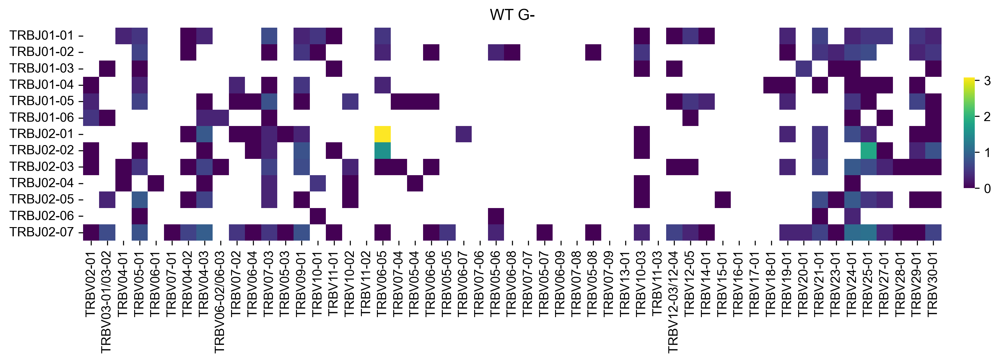

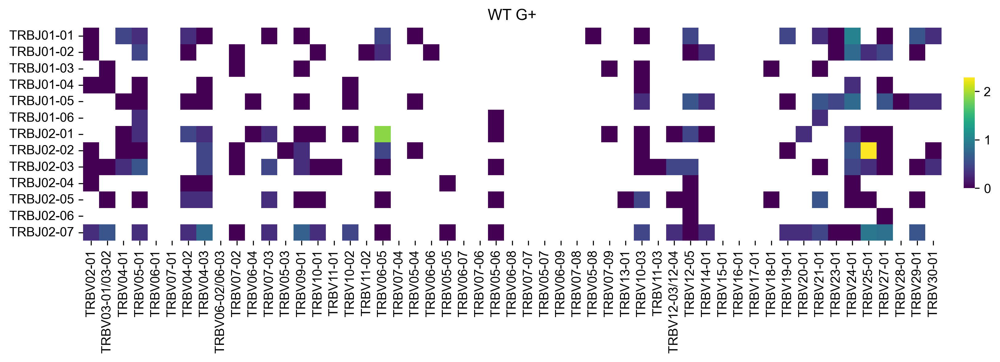

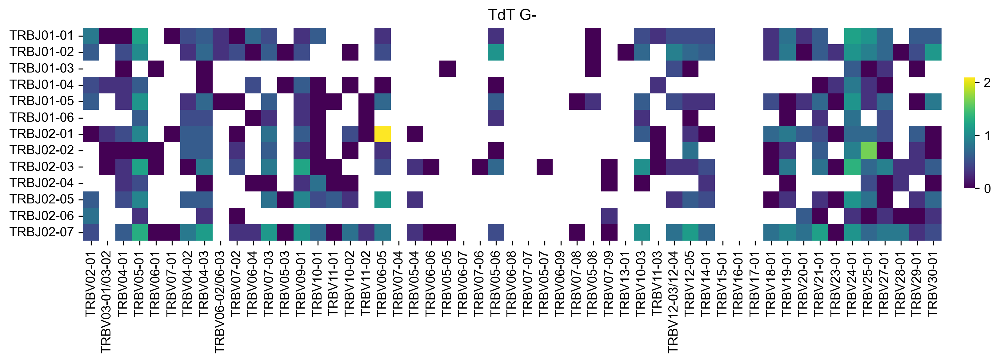

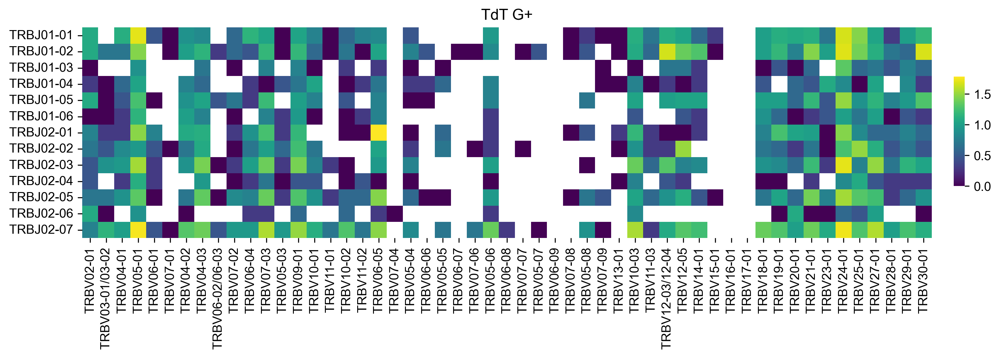

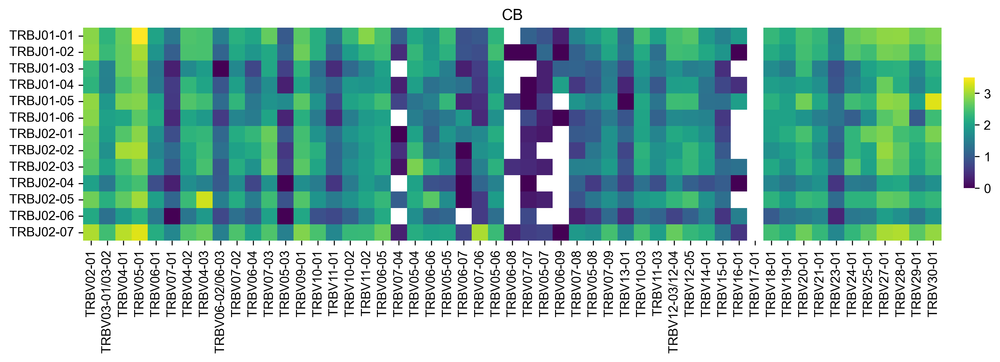

...

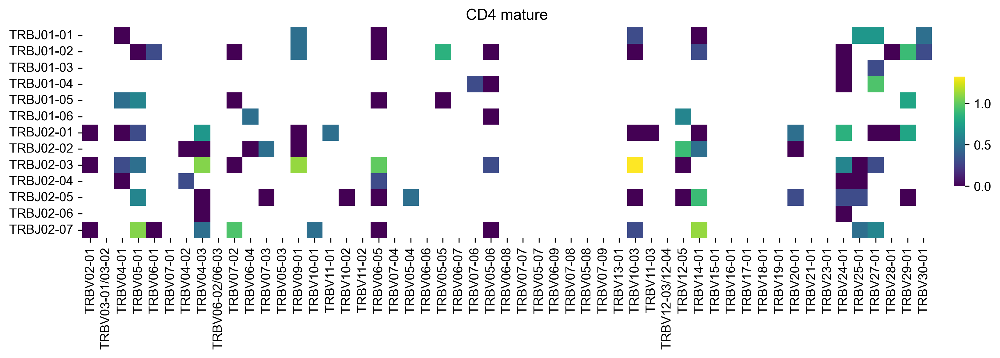

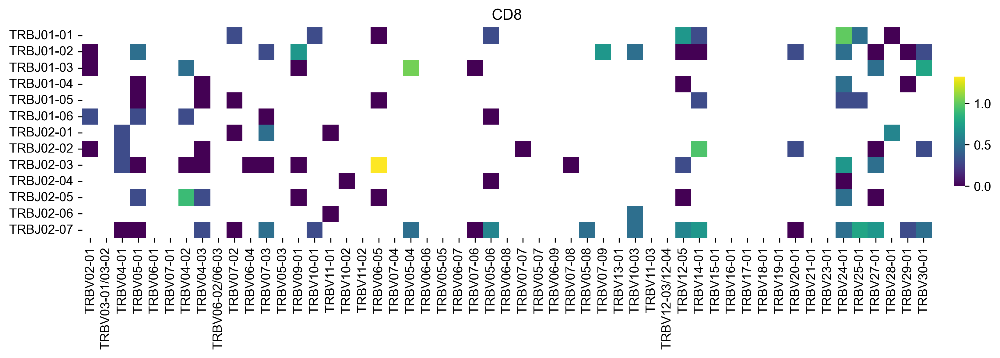

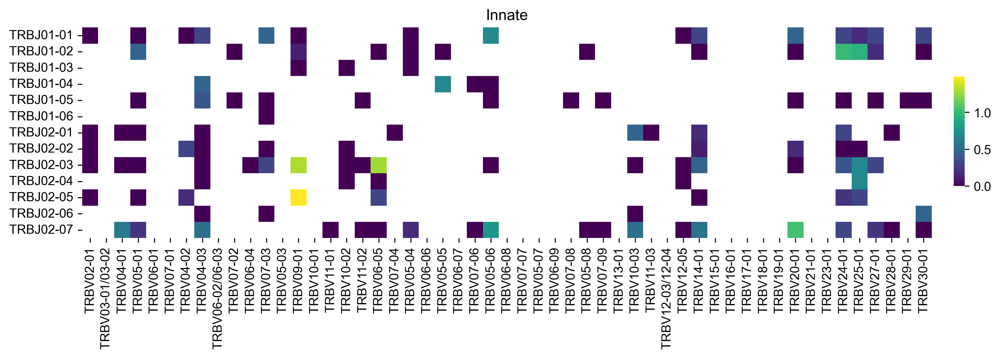

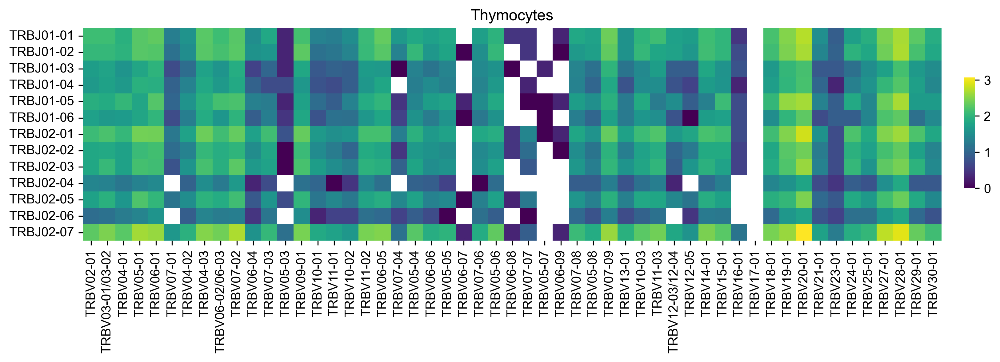

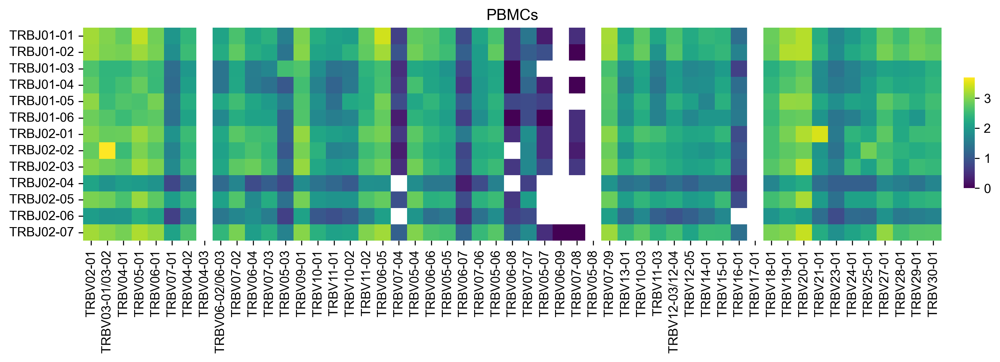

In [95]:
for subset in subsets['VJ']:
    
    data = subsets['VJ'][subset].pivot_table(index = 'JB', columns = 'VB', values = 'Templates', fill_value = 0) # means replicates
    try: 
        data.drop(['unresolved'], inplace = True)           # From rows
    except Exception as e:
        'No unresolved rows'
    try: 
        data.drop(['unresolved'], inplace = True, axis = 1) # From columns
    except Exception as e:
        'No unresolved columns'
    
    # Reorder columns based on genomic order
    columns = data.columns.tolist()
    for i, V in enumerate(TRBV):
        if V not in columns:
            # data.insert(loc = i, column = V, value = 1)
            data[V] = 0
    data = data[TRBV]
    # data = data[TRBV[::-1]] # Flip columns to match Supp Fig 28A in thymus atlas paper (Park et al 2020, Science)
    rows = data.index.tolist()
    for i, J in enumerate(TRBJ):
        if J not in rows:
            # data.insert(loc = i, column = V, value = 1)
            data.loc[J, :] = 0
    data = data.loc[TRBJ, :]

    f, ax = plt.subplots(figsize = (12, 3), ncols = 1, nrows = 1)
    cbar_ax = f.add_axes([.92, .3, .01, .4])
    
    sns.heatmap(ax = ax, data = np.log10(data), annot = False, linewidths = 0, fmt = '.3g', vmin = 0, \
                cbar_ax = cbar_ax, cmap = 'viridis').set(title = subset, xlabel = '', ylabel = '')
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)


plt.show()

#### Z-score by column

C:\Anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
C:\Anaconda3\Lib\site-packages\numpy\core\_methods.py:236: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
C:\Anaconda3\Lib\site-packages\numpy\core\_methods.py:236: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divide by zero encountered in log10
  result = func(self.values, **kwargs)
C:\Anaconda3\Lib\site-packages\numpy\core\_methods.py:236: RuntimeWarning: invalid value encountered in subtract
  x = asanyarray(arr - arrmean)
C:\Anaconda3\Lib\site-packages\pandas\core\internals\blocks.py:351: RuntimeWarning: divi

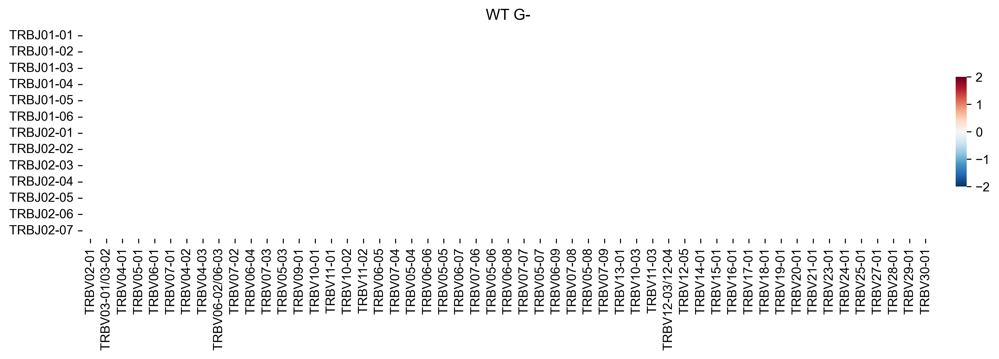

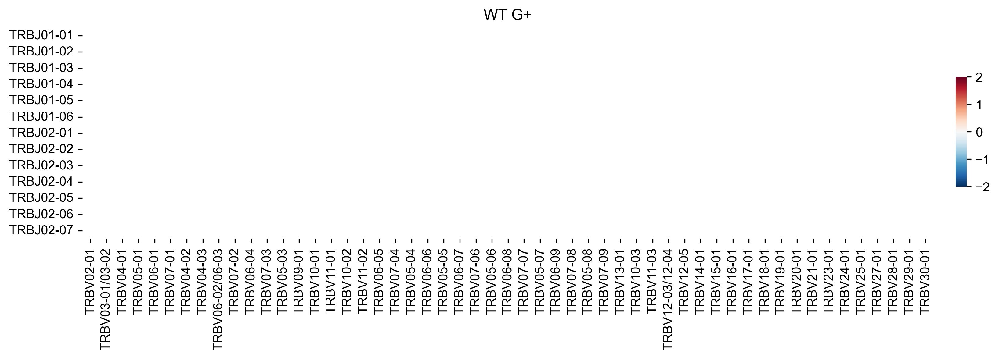

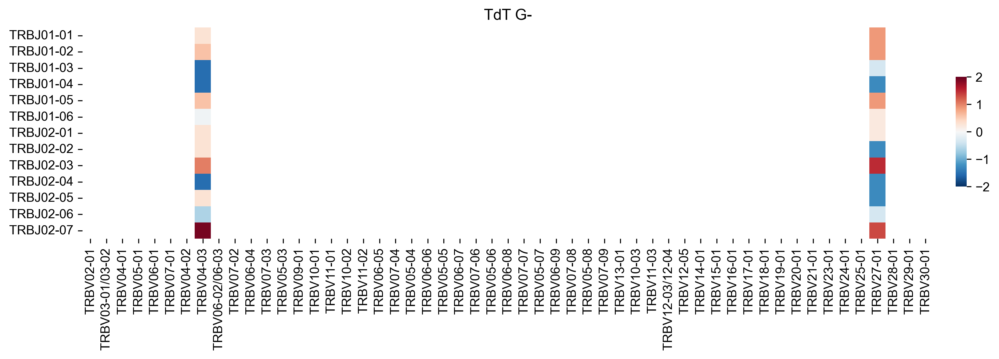

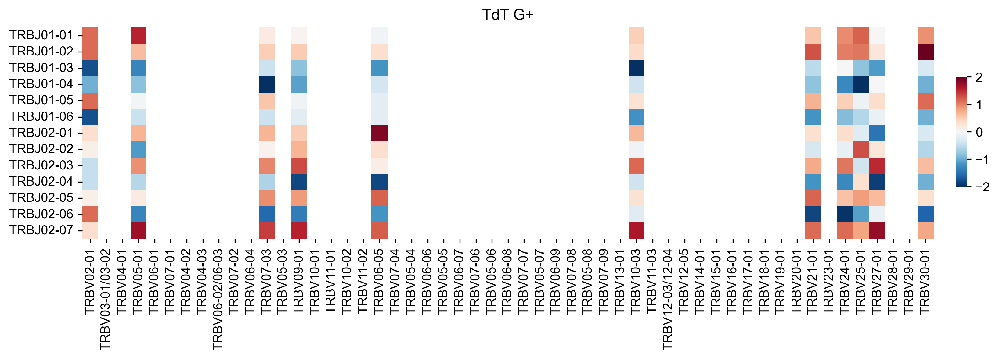

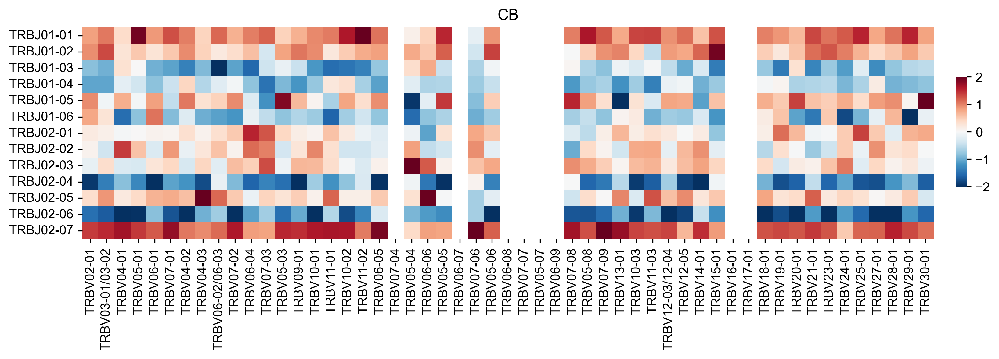

...

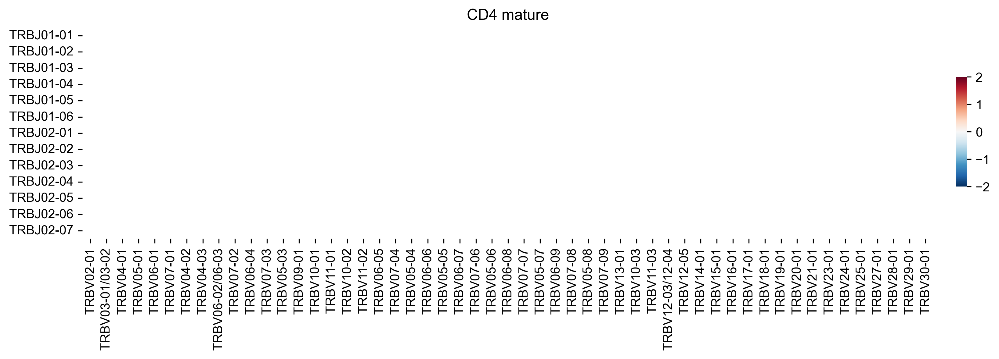

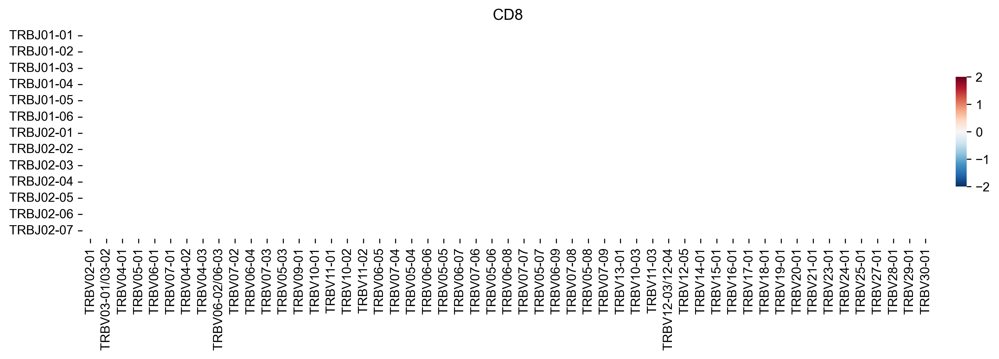

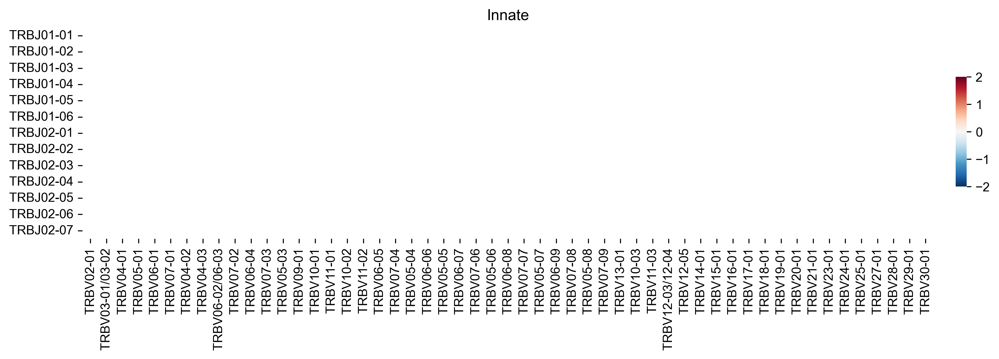

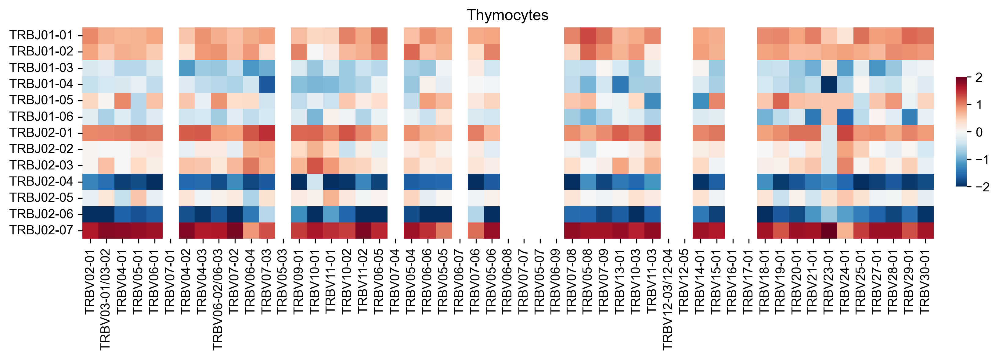

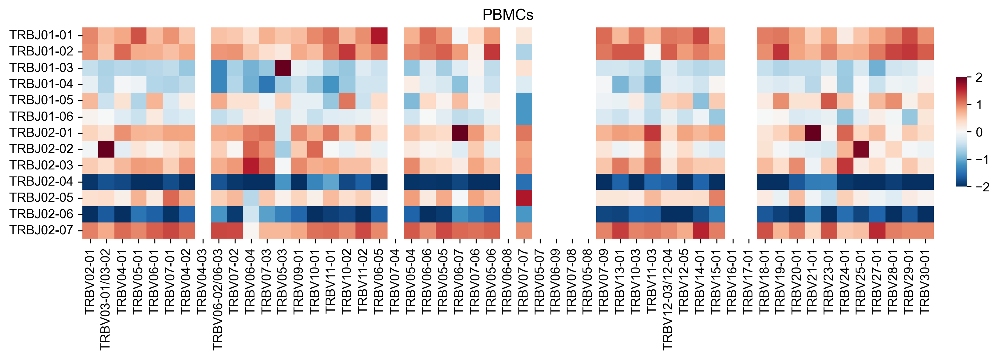

In [96]:
for subset in subsets['VJ']:
    
    data = subsets['VJ'][subset].pivot_table(index = 'JB', columns = 'VB', values = 'Templates', fill_value = 0) # means replicates
    try: 
        data.drop(['unresolved'], inplace = True)           # From rows
    except Exception as e:
        'No unresolved rows'
    try: 
        data.drop(['unresolved'], inplace = True, axis = 1) # From columns
    except Exception as e:
        'No unresolved columns'
    
    # Reorder columns based on genomic order
    columns = data.columns.tolist()
    for i, V in enumerate(TRBV):
        if V not in columns:
            # data.insert(loc = i, column = V, value = 1)
            data[V] = 0
    data = data[TRBV]
    rows = data.index.tolist()
    for i, J in enumerate(TRBJ):
        if J not in rows:
            # data.insert(loc = i, column = V, value = 1)
            data.loc[J, :] = 0
    data = data.loc[TRBJ, :]
    
    f, ax = plt.subplots(figsize = (12, 3), ncols = 1, nrows = 1)
    cbar_ax = f.add_axes([.92, .3, .01, .4])
    
    sns.heatmap(ax = ax, data = np.log10(data).apply(stats.zscore, axis = 0), annot = False, linewidths = 0, fmt = '.3g', vmin = -2, vmax = 2, \
                cbar_ax = cbar_ax, cmap = 'RdBu_r').set(title = subset, xlabel = '', ylabel = '')
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)

plt.show()

#### Z-score by row

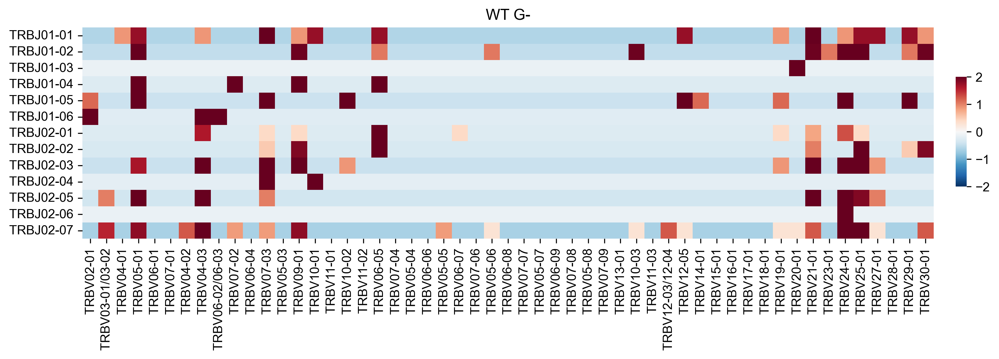

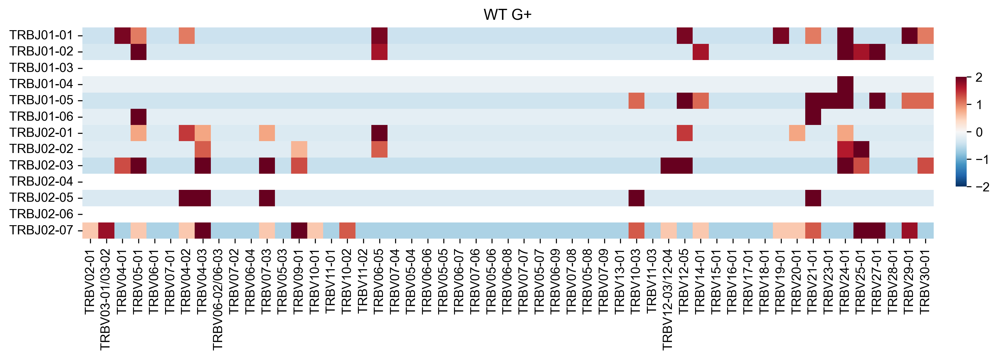

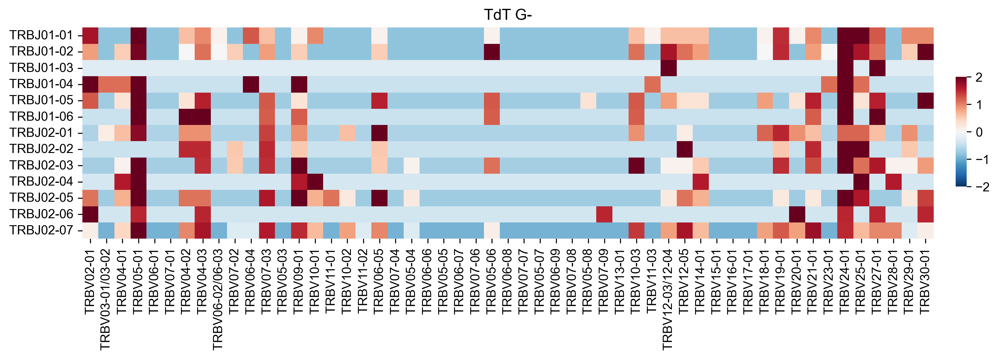

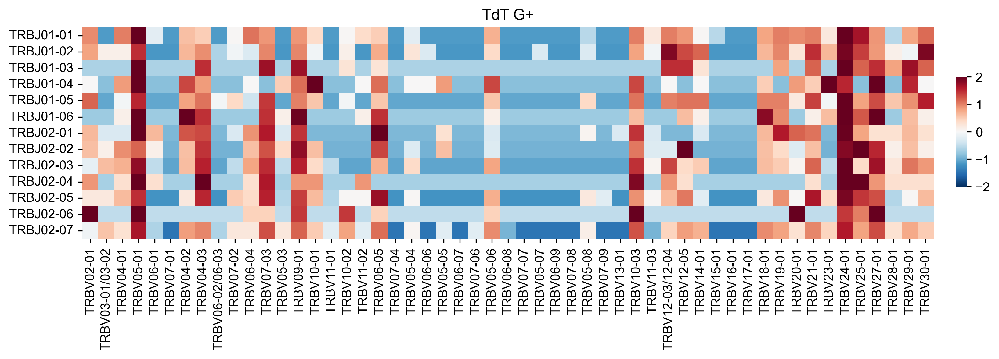

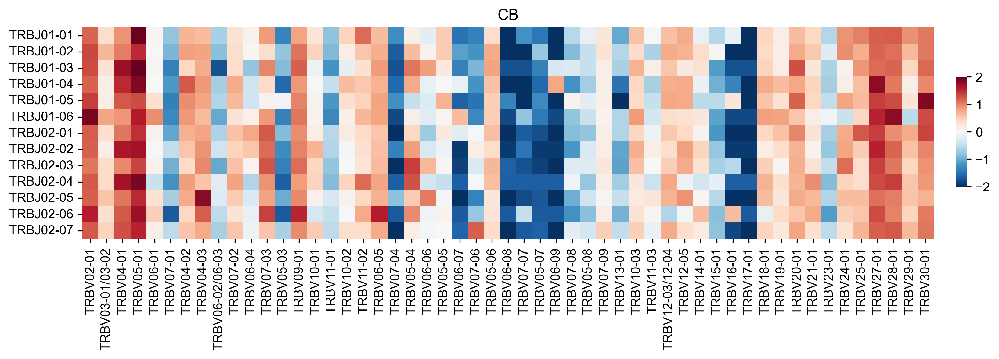

...

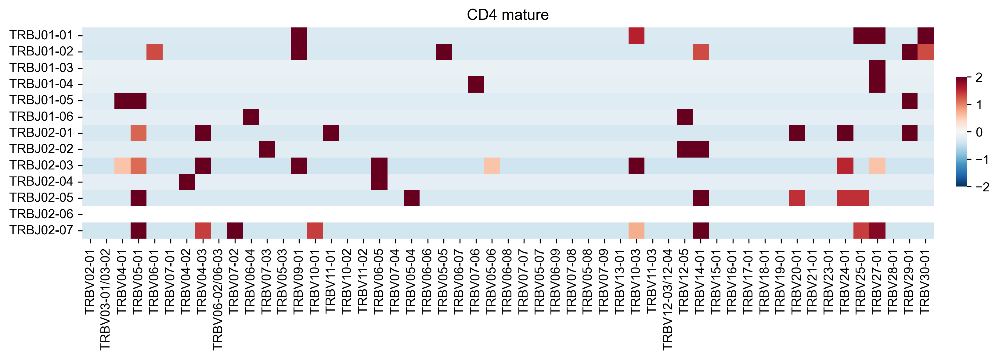

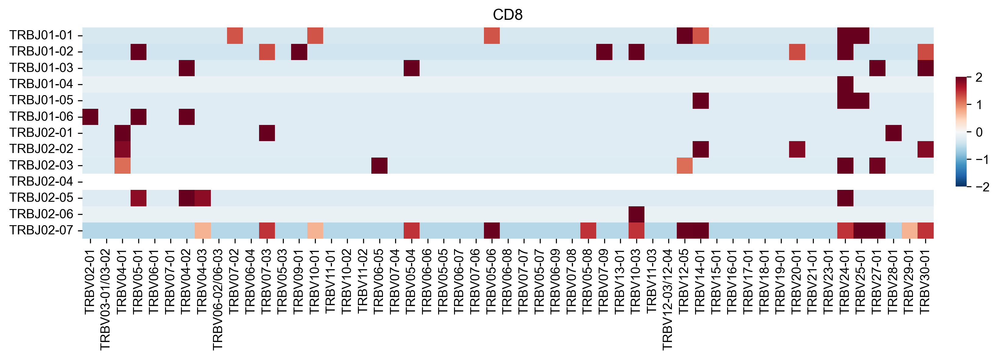

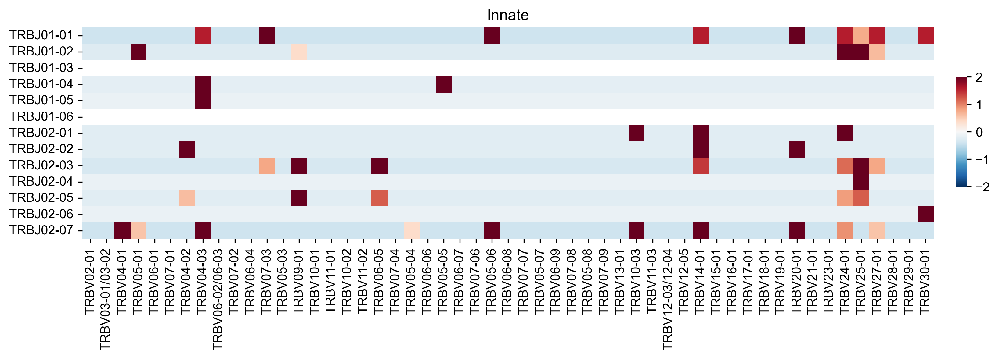

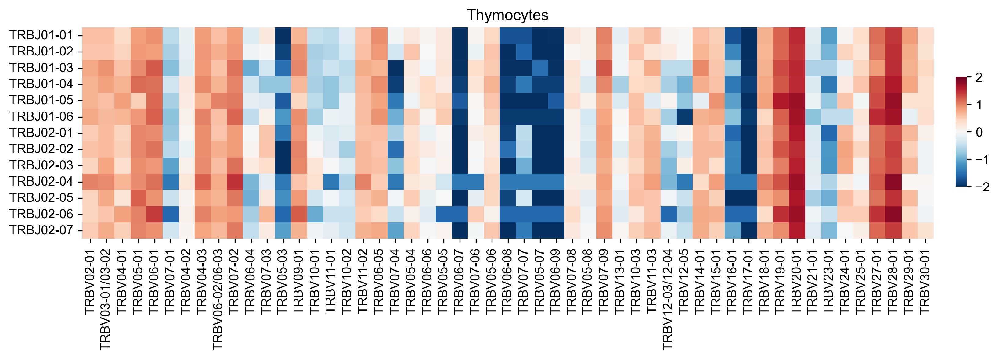

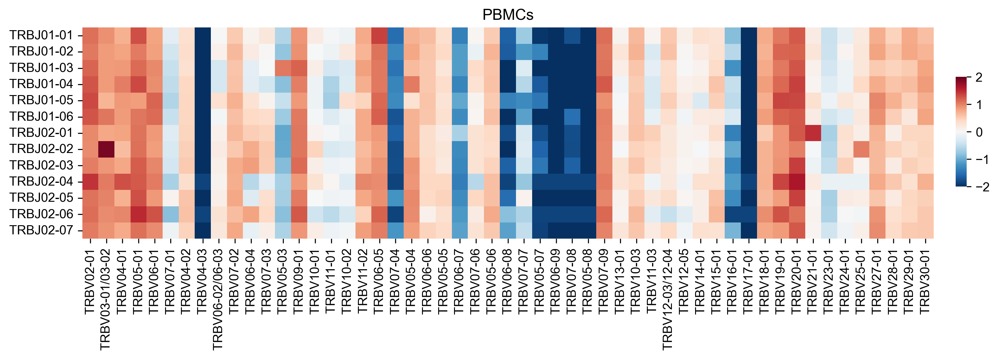

In [97]:
for subset in subsets['VJ']:
    
    data = subsets['VJ'][subset].pivot_table(index = 'JB', columns = 'VB', values = 'Templates', fill_value = 1) # means replicates
    try: 
        data.drop(['unresolved'], inplace = True)           # From rows
    except Exception as e:
        'No unresolved rows'
    try: 
        data.drop(['unresolved'], inplace = True, axis = 1) # From columns
    except Exception as e:
        'No unresolved columns'
    
    # Reorder columns based on genomic order
    columns = data.columns.tolist()
    for i, V in enumerate(TRBV):
        if V not in columns:
            # data.insert(loc = i, column = V, value = 1)
            data[V] = 1
    data = data[TRBV]
    rows = data.index.tolist()
    for i, J in enumerate(TRBJ):
        if J not in rows:
            # data.insert(loc = i, column = V, value = 1)
            data.loc[J, :] = 1
    data = data.loc[TRBJ, :]

    f, ax = plt.subplots(figsize = (12, 3), ncols = 1, nrows = 1)
    cbar_ax = f.add_axes([.92, .3, .01, .4])
    
    sns.heatmap(ax = ax, data = np.log10(data).T.apply(stats.zscore, axis = 0).T, annot = False, linewidths = 0, fmt = '.3g', vmin = -2, vmax = 2, \
                cbar_ax = cbar_ax, cmap = 'RdBu_r').set(title = subset, xlabel = '', ylabel = '')
    ax.set_xticklabels(ax.get_xticklabels(), rotation = 90)

plt.show()

In [61]:
data
np.log10(data).T
# stats.zscore(np.log10(data))
np.log10(data).T.apply(stats.zscore, axis = 0).T

v_gene,TCRBV01-01,TCRBV02-01,TCRBV03-01/03-02,TCRBV04-01,TCRBV04-02,TCRBV05-01,TCRBV05-02,TCRBV05-03,TCRBV05-04,TCRBV05-05,...,TCRBV21-01,TCRBV22-01,TCRBV23-01,TCRBV24-01,TCRBV25-01,TCRBV27-01,TCRBV28-01,TCRBV29-01,TCRBV30-01,TCRBVA-01
j_gene,,,,,,,,,,,,,,,,,,,,,
TCRBJ01-01,-0.556456,1.137459,0.840876,0.790464,0.306200,1.245801,-2.448075,-0.250550,0.760677,0.385827,...,0.660038,-2.448075,0.149449,0.519158,0.314548,0.915696,0.435392,0.826874,0.704839,-2.099470
TCRBJ01-02,-0.659869,1.080178,0.868024,0.806632,0.307162,1.114044,-2.412137,-0.157472,0.814473,0.354316,...,0.645804,-2.412137,0.110287,0.557735,0.366749,0.939903,0.571818,0.857121,0.749570,-2.412137
TCRBJ01-03,-0.535833,1.192903,0.911584,0.932837,0.379659,1.251610,-2.221796,-0.313801,0.677007,0.328729,...,0.754823,-2.221796,0.168426,0.509861,0.301457,0.806225,0.519485,0.654839,0.861324,-2.221796
TCRBJ01-04,-0.591202,1.238785,0.881218,0.972879,0.376414,1.334293,-2.300740,-0.359820,0.747904,0.386790,...,0.734086,-2.300740,0.247765,0.506885,0.421688,0.972879,0.584646,0.714161,0.874696,-2.300740
TCRBJ01-05,-0.602796,1.243776,0.717397,0.812605,0.267306,0.925429,-2.506406,0.028521,0.342847,0.288036,...,0.927550,-2.506406,0.288036,0.751973,0.090186,1.075147,0.651538,0.446050,0.785871,-2.125684
TCRBJ01-06,-0.730634,1.283591,1.019195,0.759903,0.355053,1.226648,-2.354551,-0.185562,0.712981,0.301943,...,0.747250,-2.354551,0.157101,0.539882,0.290704,1.131603,0.528752,0.243405,0.897236,-2.354551
TCRBJ02-01,-0.460059,1.052379,0.902268,0.886727,0.477926,1.246693,-2.522135,-0.250849,0.795662,0.229706,...,0.609538,-2.158608,-0.024577,0.627942,0.210019,0.869898,0.215720,0.534900,0.566331,-2.522135
TCRBJ02-02,-0.309822,1.139990,1.012006,0.831740,0.524563,1.353538,-2.454573,-0.360783,0.883253,0.241145,...,0.624864,-2.454573,-0.066679,0.687775,0.193643,0.871552,0.352315,0.553983,0.620253,-1.839146
TCRBJ02-03,-0.228947,1.083641,0.976161,0.834907,0.532203,1.322785,-2.538811,-0.255985,0.976830,0.254050,...,0.536848,-2.538811,0.031014,0.632440,0.174548,0.791107,0.210098,0.550540,0.521205,-2.173438
